In [1]:
!cat readme.txt

In [2]:
# https://core.ac.uk/download/pdf/83461632.pdf

# https://www.emerald.com/insight/content/doi/10.1108/JSIT-10-2016-0061/full/pdf?casa_token=P8yIBuV70x4AAAAA:4rCEvt-IJa6g12I3JydKrI-RIP2sASgZYCBQdF7h49B3bWFlmtoLefn5cYIhmroh_6KIxUkWRTvm7R5PWPrf5sG11eNb4EzcstM7g0fjbcKh1kGFnGHk

In [141]:
import numpy as np 
import pandas as pd
import pyarrow
import sys

from datetime import datetime, timedelta
from matplotlib import pyplot as plt

import tqdm

%matplotlib inline

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeClassifier

from collections import Counter

from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from catboost import CatBoostClassifier
import seaborn as sns

from sklearn.metrics import average_precision_score, roc_auc_score, roc_curve, classification_report, precision_recall_curve

In [4]:
# from utils import diff_to_days _get_features

In [5]:
# import warnings
# warnings.filterwarnings("ignore", category=FutureWarning)

In [6]:
!pip freeze > requirements.txt
!mkdir results

mkdir: cannot create directory ‘results’: File exists


# 1.Анализ данных (EDA)

In [7]:
# Что лежит в папке
!ls -Slhr

total 1.3G
drwxr-xr-x 2 root root    6 Jan 18 01:04  results
drwxr-xr-x 5 root root  138 Jan 17 23:34  catboost_info
-rw-r--r-- 1 root root 1.4K Jan 17 23:18  tree_depth3.dot
-rw-r--r-- 1 root root 1.9K Jan 18 01:15  requirements.txt
-rw-r--r-- 1 root root 1.9K Jan  7 20:29  readme.txt
drwxr-xr-x 3 root root 4.0K Jan 17 23:09  results_original
-rw-r--r-- 1 root root 5.5K Jan 17 18:23  tree.dot
-rw-r--r-- 1 root root 6.8K Jan 17 21:52  utils.py
-rw-r--r-- 1 root root  10K Dec 28 05:46 'data description.xlsx'
-rw-r--r-- 1 root root  17K Sep 18 13:38  plants.csv
-rw-r--r-- 1 root root  56K Jan 17 14:52  df_stat.csv
-rw-r--r-- 1 root root 327K Jan 16 04:06  lenta.ipynb
-rw-r--r-- 1 root root 3.7M Jan 18 01:08  lenta2.ipynb
-rw-r--r-- 1 root root 4.7M Sep 18 13:40  clients.csv
-rw-r--r-- 1 root root 6.6M Jan 18 01:14  lenta4.ipynb
-rw-r--r-- 1 root root 6.6M Jan 18 01:14  lenta3.ipynb
-rw-r--r-- 1 root root  18M Sep 18 13:38  materials.csv
-rw-r--r-- 1 root root 1.2G Dec 28 13:42  transacti

In [8]:
%%time
filepath = 'transactions.parquet'
df = pd.read_parquet(filepath, engine='pyarrow')
print("df.shape", df.shape)
df.head()

df.shape (32109414, 9)
CPU times: user 21.3 s, sys: 10.5 s, total: 31.9 s
Wall time: 17.8 s


,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo
0,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,004,90fca68123e692a005a4edeadd94b2f2,232cfe8b28970434f685b737737b26d4,2.0,146.98,0
1,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,003,90fca68123e692a005a4edeadd94b2f2,12ec64451b8e426db16f3f05ea770901,1.0,249.99,1
2,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,012,90fca68123e692a005a4edeadd94b2f2,1212ff8ecf53aebef093ca8ae216db68,1.0,47.99,1
3,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,013,90fca68123e692a005a4edeadd94b2f2,1212ff8ecf53aebef093ca8ae216db68,1.0,47.99,1
4,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,011,90fca68123e692a005a4edeadd94b2f2,571c6d3b559db8445e05265649eb30ab,2.0,53.98,1


In [9]:
# Сколько уникальных элементов, что за тип
for key in df.keys():
    print(f"{key} {' '*(20-len(key))}  {df[key].nunique()} \t {df[key].dtype}")

chq_id                 2964775 	 object
plant                  388 	 object
chq_date               366 	 datetime64[ns]
chq_position           459 	 object
client_id              100000 	 object
material               105694 	 object
sales_count            9359 	 float64
sales_sum              173839 	 float64
is_promo               2 	 int64


In [10]:
# Посмотрим на один id-шник транзакции
df[df['chq_id'] == 'ce5b3d1c531348c5d0d8e859b6d0cf91'].sort_values('chq_position')

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo
5,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,001,90fca68123e692a005a4edeadd94b2f2,76608b1b1d38384fcac3e2b14e6ec0c9,2.000,64.78,1
11,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,002,90fca68123e692a005a4edeadd94b2f2,ada84ea081d5d3c919dc12a5bdde904e,1.000,179.99,1
1,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,003,90fca68123e692a005a4edeadd94b2f2,12ec64451b8e426db16f3f05ea770901,1.000,249.99,1
0,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,004,90fca68123e692a005a4edeadd94b2f2,232cfe8b28970434f685b737737b26d4,2.000,146.98,0
9,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,005,90fca68123e692a005a4edeadd94b2f2,b726b2ec8d0643d38e29d96733153dd4,2.000,51.98,1
6,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,006,90fca68123e692a005a4edeadd94b2f2,86069eddeab2b94b00eca5801628c879,0.728,65.51,0
8,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,007,90fca68123e692a005a4edeadd94b2f2,f6f07df28266b03cb7822b62abf0a385,2.000,72.99,1
10,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,008,90fca68123e692a005a4edeadd94b2f2,33fa1fd7d0c11ccde404416d63e9b50a,1.000,549.94,1
12,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,009,90fca68123e692a005a4edeadd94b2f2,e09bae8a6aa3492347bef47d9913344a,1.000,64.89,0
7,ce5b3d1c531348c5d0d8e859b6d0cf91,7cd86ecb09aa48c6e620b340f6a74592,2016-11-01,010,90fca68123e692a005a4edeadd94b2f2,cd8645ab842a98332560a07d137aed24,1.000,36.99,1


In [11]:
# Одной транзакции соответствует только одна дата?
# > Да
df.groupby('chq_id')['chq_date'].nunique().sort_values()

chq_id
00000391443926003b45cebac9a4c0b2    1
aa9396b8fb0c77d0b3212a11c6c001d0    1
aa93a13cc6647f4a4040778ea2518e87    1
aa93a620266697563a6f5d49bcf84d21    1
aa93abce2f67950a13c8eb049962ae5e    1
                                   ..
55578139ad4d993942819014035f8c13    1
5557935b6247e2ffbdd80c311179ece9    1
555793833019971b3b6ecd3a40a046bb    1
5557bd59e8afe67d52fd84c6b75a237a    1
fffff22a5bb4ef42a166e2e20cff0d14    1
Name: chq_date, Length: 2964775, dtype: int64

Text(0, 0.5, 'Number of transactions')

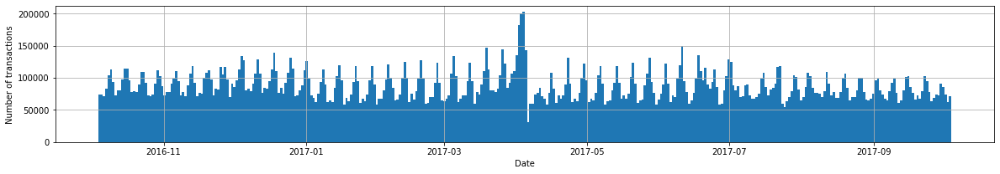

In [12]:
# Нарисуем распределение транзакция по времени
df['chq_date'].hist(figsize = (20, 3), bins = df['chq_date'].nunique())
plt.xlabel('Date')
plt.ylabel('Number of transactions')

### Обратим внимание на две другие таблицы и добавим некоторые поля оттуда

#### df_materials

In [13]:
df_materials = pd.read_csv('materials.csv')
print(df_materials.nunique())
    
df_materials.head()

material            105609
hier_level_1             2
hier_level_2            60
hier_level_3           391
hier_level_4          2006
vendor                4185
is_private_label         2
is_alco                  2
dtype: int64


,material,hier_level_1,hier_level_2,hier_level_3,hier_level_4,vendor,is_private_label,is_alco
0,35cbdf61de9e19c8b417327aaef14c88,NONFOOD,ea5d2f1c4608232e07d3aa3d998e5135,99cad265a1768cc2dd013f0e740300ae,9eed45f71360b4b1e2590637467220e5,212a38db0ddcd009f1e164cc8483485c,0,0
1,c0b0bf24d4ec71da3d304f761ec555d8,NONFOOD,ea5d2f1c4608232e07d3aa3d998e5135,99cad265a1768cc2dd013f0e740300ae,de2eb747e0896c050905a6b635ab800a,9b0b6c7d55413ad3b67761b7b125b534,0,0
2,f0fc5e654a81a7c4b8ba8d7c26546e14,NONFOOD,ea5d2f1c4608232e07d3aa3d998e5135,99cad265a1768cc2dd013f0e740300ae,8a969031832c535daf96e0c2aed8e814,9b0b6c7d55413ad3b67761b7b125b534,0,0
3,353693e64fb5f9e2d29746d7fe6edf1e,NONFOOD,ea5d2f1c4608232e07d3aa3d998e5135,b58f7d184743106a8a66028b7a28937c,4c0dc012ebb679a18b244c53c6f59b5a,a3c8be149d718771e892619bd310b961,0,0
4,5d9e0b4302ce95448cae72165ff4cf5b,NONFOOD,ea5d2f1c4608232e07d3aa3d998e5135,b58f7d184743106a8a66028b7a28937c,4c0dc012ebb679a18b244c53c6f59b5a,a3c8be149d718771e892619bd310b961,0,0


In [14]:
o = df_materials.set_index('material')
for key in ['hier_level_1', 'is_private_label', 'is_alco']:
    dct = o[key].to_dict()
    df[f'material__{key}'] = df['material'].map(dct)
    
df['material__is_food'] = (df['material__hier_level_1']=='FOOD').astype(int)
del df['material__hier_level_1']

In [15]:
df.keys()

Index(['chq_id', 'plant', 'chq_date', 'chq_position', 'client_id', 'material',
       'sales_count', 'sales_sum', 'is_promo', 'material__is_private_label',
       'material__is_alco', 'material__is_food'],
      dtype='object')

#### df_plants

In [16]:
df_plants = pd.read_csv('plants.csv')
print(df_plants.nunique())
print("HM", df_plants['plant_type'].unique())
print("city", df_plants['city'].unique())
df_plants.head()


plant         388
plant_type      2
city            3
dtype: int64
HM ['HM' 'SM']
city ['St. Petersburg' 'Other' 'Moscow']


,plant,plant_type,city
0,95b09698fda1f64af16708ffb859eab9,HM,St. Petersburg
1,926abae84a4bd33c834bc6b981b8cf30,HM,St. Petersburg
2,ae2bac2e4b4da805d01b2952d7e35ba4,HM,St. Petersburg
3,0e7e3cf0ded4d9db8b376b317c007f99,HM,St. Petersburg
4,540bd55a2cf295b8ea9cd78650e89d03,HM,St. Petersburg


In [17]:
o = df_plants.set_index('plant')

dct = (o["plant_type"]=='SM').astype(int).to_dict()
df[f'plant__is_SM'] = df['plant'].map(dct)

for city in  ['St. Petersburg', 'Other', 'Moscow']:
    dct = (o["city"]==f'{city}').astype(int).to_dict()
    df[f'plant__is_city_{city}'] = df['plant'].map(dct)

In [18]:
df.keys()

Index(['chq_id', 'plant', 'chq_date', 'chq_position', 'client_id', 'material',
       'sales_count', 'sales_sum', 'is_promo', 'material__is_private_label',
       'material__is_alco', 'material__is_food', 'plant__is_SM',
       'plant__is_city_St. Petersburg', 'plant__is_city_Other',
       'plant__is_city_Moscow'],
      dtype='object')

### Добавим колонки - агрегаты по транзакции

In [19]:
%%time

# Колонка количество товаров в транзакции (с учетом дубликатов)
dct = df.groupby('chq_id')['sales_count'].sum().to_dict()
df['chq_id_sum_sales_count'] = df['chq_id'].apply(lambda x:dct[x])

# Колонка количество товаров в транзакции (без учетом дубликатов)
dct = df.groupby('chq_id').apply(len).to_dict()
df['chq_id_len'] = df['chq_id'].apply(lambda x:dct[x])

# Сумма sales_sum товров в транзакции
dct = df.groupby('chq_id')['sales_sum'].sum().to_dict()
df['chq_id_sum_sales_sum'] = df['chq_id'].apply(lambda x:dct[x])

# Количество еды, алкоголя, is_private_label товров в транзакции
for key in ['material__is_private_label', 'material__is_alco', 'material__is_food']:
    dct = df.groupby('chq_id')[key].mean().to_dict()
    df[f'chq_id_{key}'] = df['chq_id'].apply(lambda x:dct[x])

CPU times: user 4min 4s, sys: 11.5 s, total: 4min 15s
Wall time: 4min 15s


### Добавим колоноки - агрегаты по времени (для отрисовки графиков)

In [20]:
%%time
# Создаем различные варианты агрегаций времени

# Месяц
df['chq_date(month)']       = pd.to_datetime(df['chq_date'].dt.strftime('%Y.%m'))

# Неделя
df['chq_date(week)']        = df['chq_date'].apply(lambda dt: dt - timedelta(days=dt.weekday()))

# День недели
day_of_week_list = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['chq_date[day_of_week]'] = df['chq_date'].dt.dayofweek#.apply(lambda x:day_of_week_list[x])

CPU times: user 16min 33s, sys: 16.8 s, total: 16min 50s
Wall time: 16min 48s


In [21]:
# Данные идут всегда через день?
# > Да, равномерно через день
set(np.diff(sorted(df["chq_date"].unique())))

{numpy.timedelta64(86400000000000,'ns')}

### Графики зависимости от времени

In [22]:
%%time
#### Построем всякие различные графики по времени
# построим таблицу, проиндексированную по датам, сохранив ее
# len - число строк для данной даты в исх. таблице
# user_unique - число уникальных клиентов в день
# transaction_unique - число уникальнных транзакций в день
# sales_sum - за день продано на такую сумму
# sales_count - число проданных товаров
# average_sum - средняя сумма транзы в день
# material - число уникальных товаров, которые были проданы в этот день
# is_promo_sum - суммарное число проданных промо товаров в день
# is_promo_per_trans - среднее число проданных по промо товаров на транзакцию в этот день
# is_promo_sales_sum_sum - общая стоимость проданных по промо товаров
# is_promo_sales_sum_mean - общая сумма купленного по промо по отношению к общей сумме проданного в день
#unique_plant - число магазинов, в которых что-то было продано в этот день

def get_time_features(data):
    res = {'len' : len(data),
           'user_unique': data['client_id'].nunique(),
           'transaction_unique':data['chq_id'].nunique(),
           'sales_sum':data['sales_sum'].sum(),
           'sales_count':data['sales_count'].sum(),
           'average_sum':data['sales_sum'].mean(),
           'material':data['material'].nunique(),
           'is_promo_sum':data['is_promo'].sum(),
           'is_promo_per_trans':data['is_promo'].mean(),
           'is_promo_sales_sum_sum':data.loc[data['is_promo']==1, 'sales_sum'].sum(),
           'is_promo_sales_sum_mean':data.loc[data['is_promo']==1, 'sales_sum'].sum()/data['sales_sum'].sum(),
           'unique_plant':data['plant'].nunique()
          }
    return pd.Series(res)

df_stat = df.groupby('chq_date').apply(get_time_features)
df_stat.to_csv(r'df_stat.csv')

CPU times: user 42.2 s, sys: 4.81 s, total: 47 s
Wall time: 47 s


#### По дням

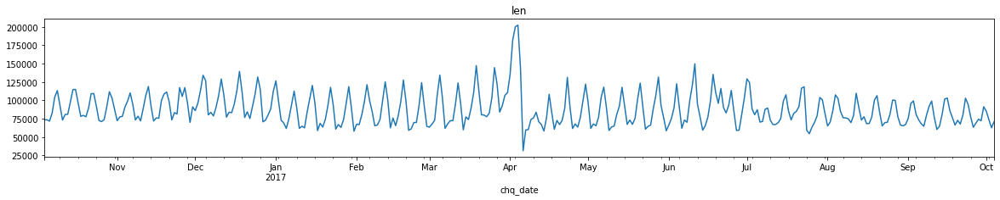

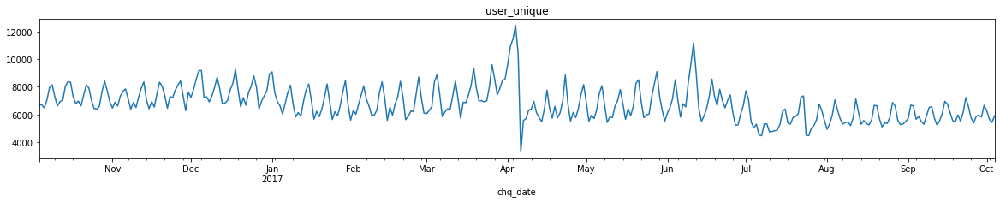

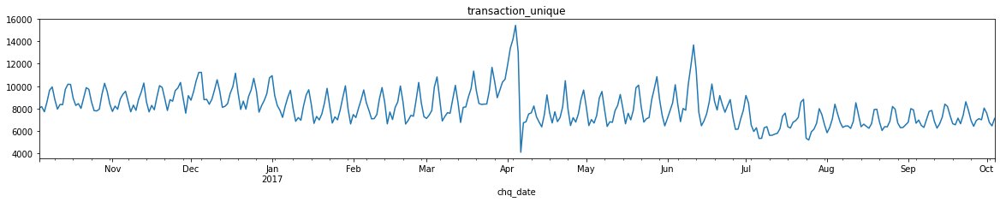

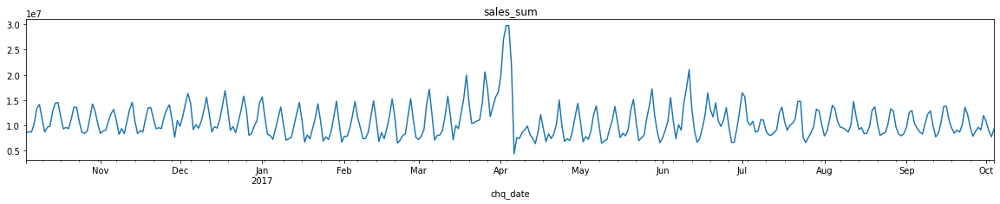

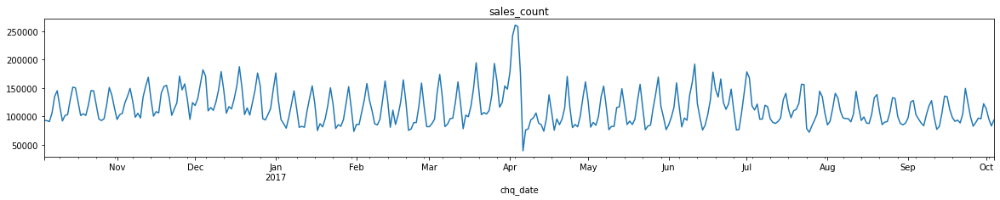

...

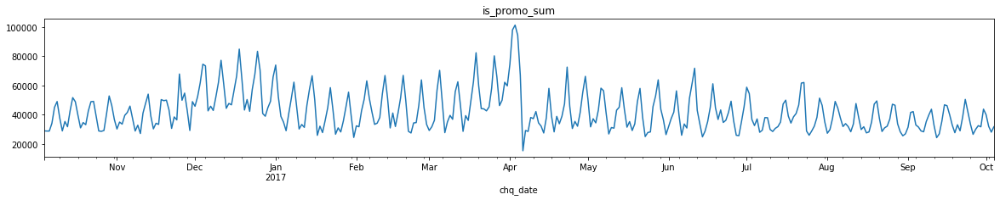

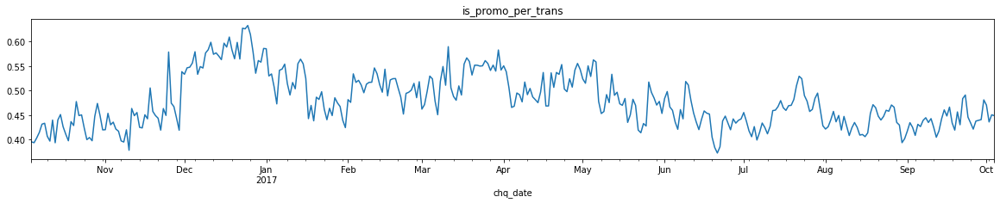

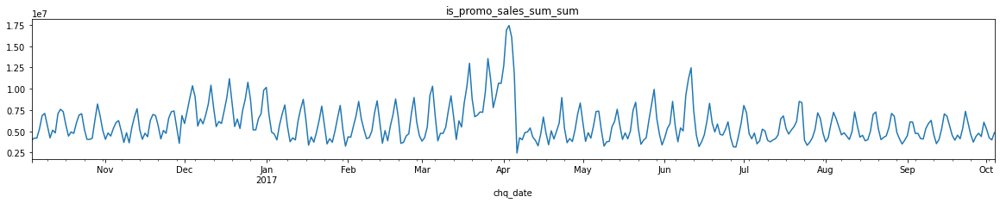

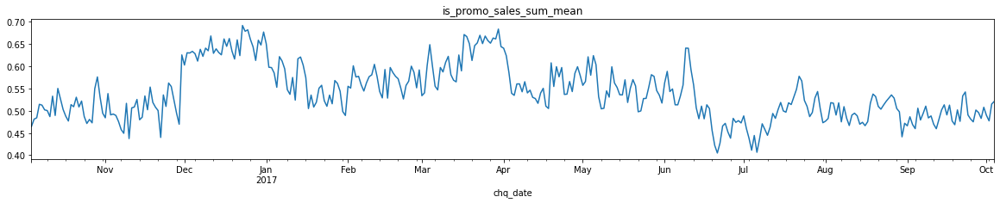

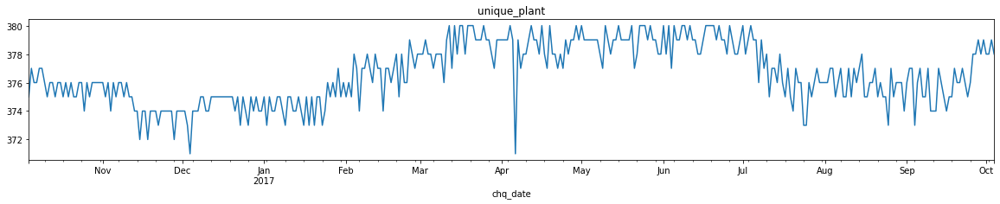

In [23]:
## Подневно
for key in df_stat.keys():
    df_stat[key].plot(figsize = (20, 3), title = key)
    #df_stat[key][-140-7*12:-112-7*12].reset_index(drop=True).plot(figsize = (20, 3), title = key)


    plt.show()
    
# есть сильная зависимость по дням
# по выходным на 50-70% лучше чем на неделе

# сезонной ззависимости мало

# есть небольшой общий тренд на понижение

# в апреле что-то случилось

In [24]:
#возле апреля интересное поведение графика average sum - средняя сумма транзакции росла в теч. месяца до странного события
#это могло бы объяснить некоторые графики, но не уникальное число покупателей в день - user_unique
#т.е. ближе к апрелю росло число покупателей И их средний чек
#конец какой-то скидочной программы? если и так, то это не промо-товары из таблицы: доля промо товаров в чеке и доля промо в проданном 
#не росли, подходя к рассматриваемой точке
#возможно, другая бонусная программа

#### По месяцам

Графики по месяцам


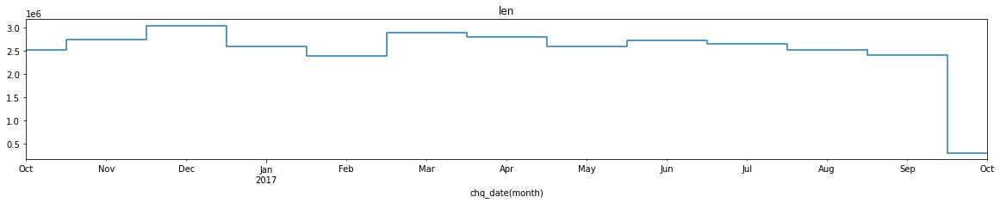

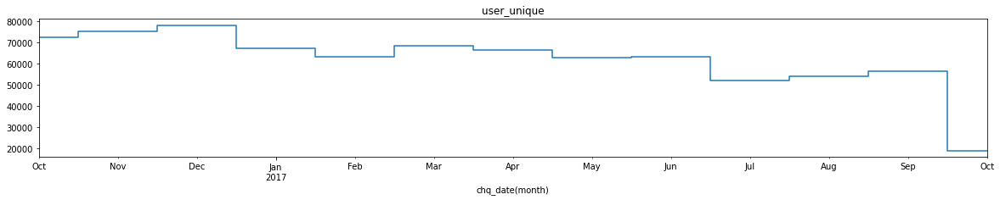

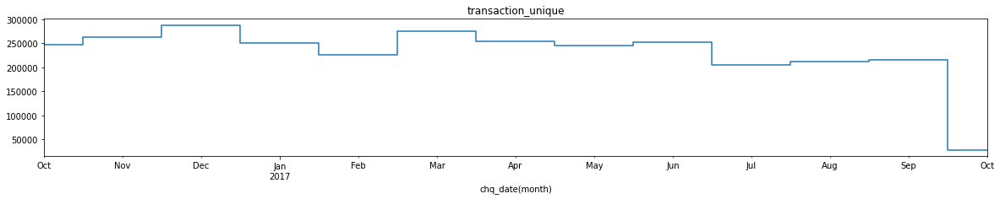

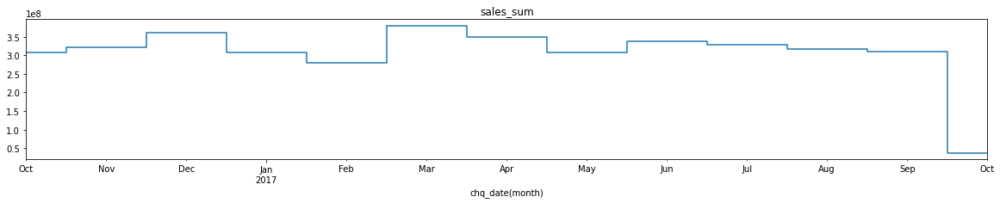

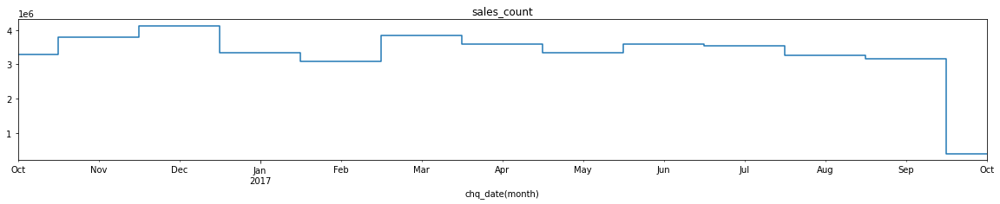

...

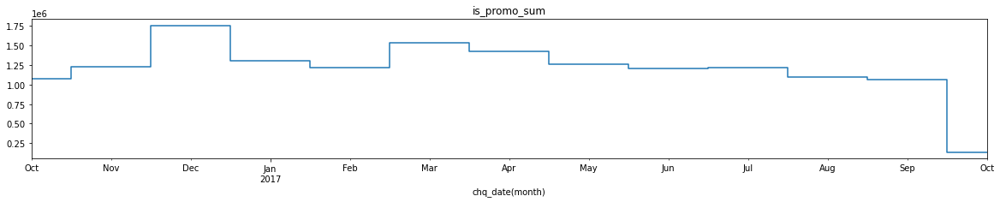

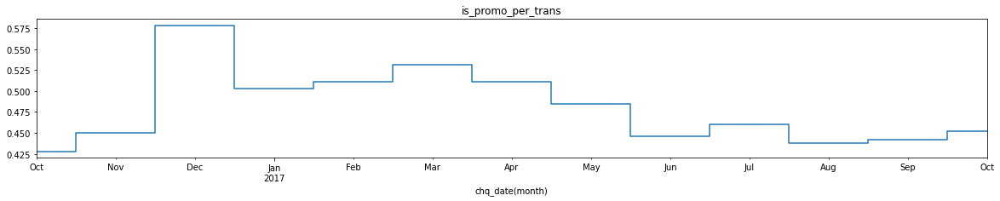

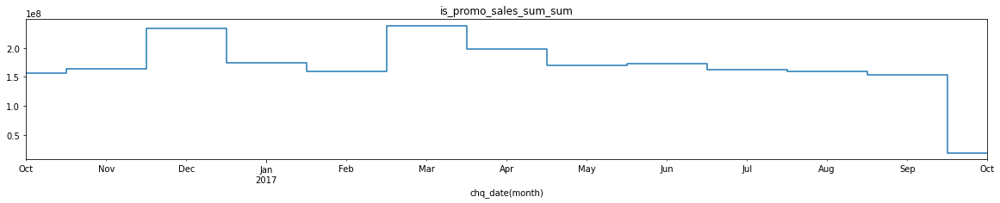

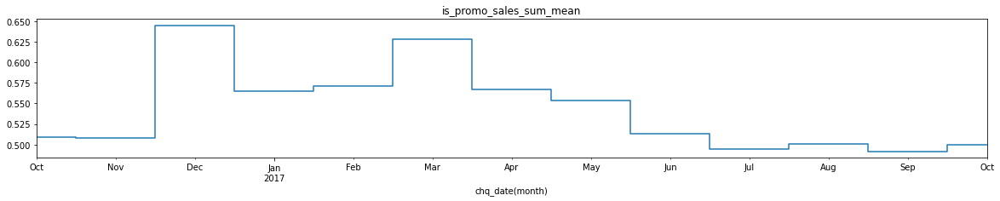

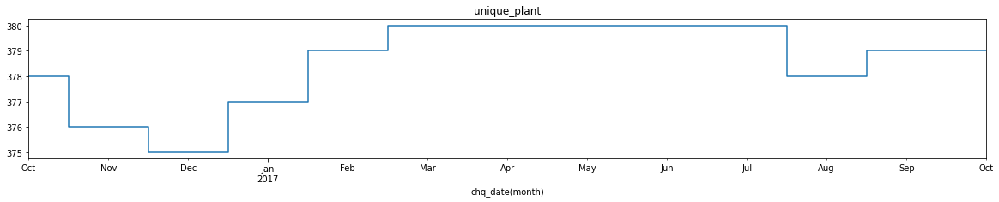

CPU times: user 6min 49s, sys: 7.08 s, total: 6min 56s
Wall time: 6min 55s


In [25]:
%%time
# # Создаем различные варианты агрегаций времени
# # Месяц

df['chq_date(month)'] = pd.to_datetime(df['chq_date'].dt.strftime('%Y.%m'))

print('Графики по месяцам')
df_temp = df.groupby('chq_date(month)').apply(get_time_features)
## Подневно
for key in df_temp.keys():
    df_temp[key].plot(figsize = (20, 3), 
                      title = key, 
                      drawstyle ="steps-mid")
    plt.show()

#### По неделям

Графики по неделям


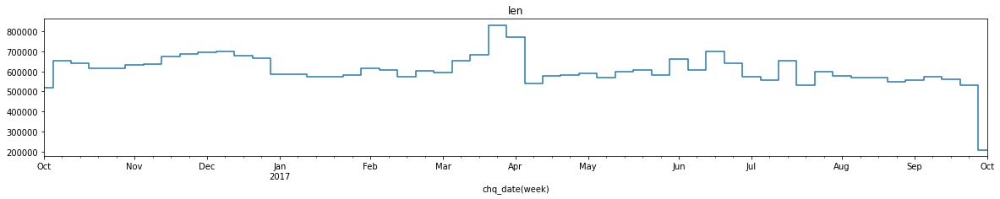

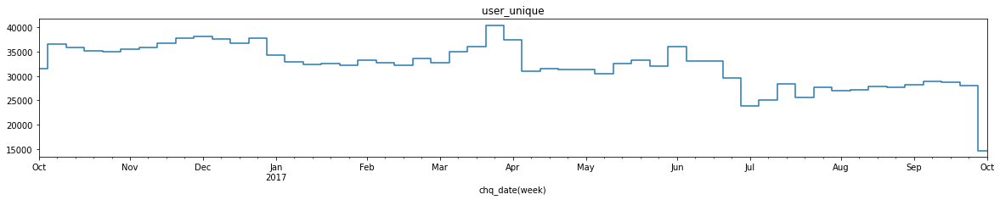

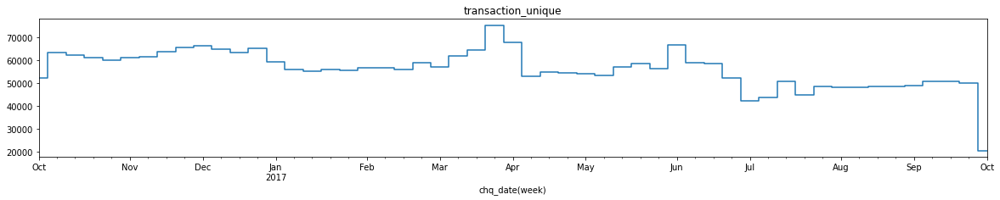

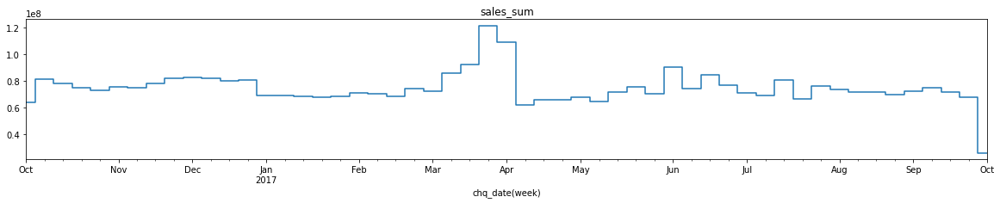

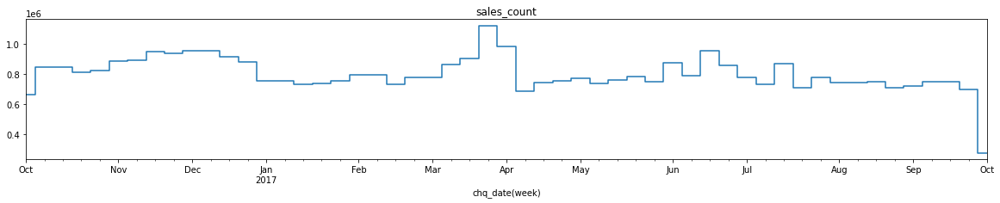

...

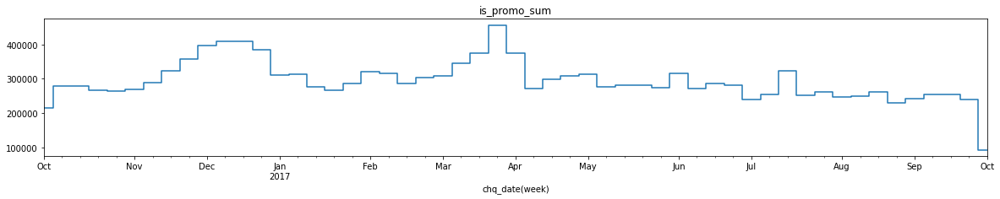

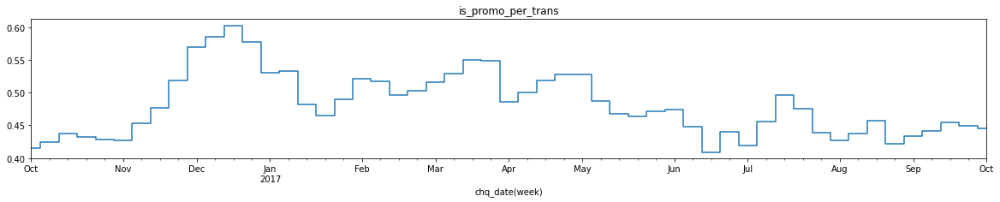

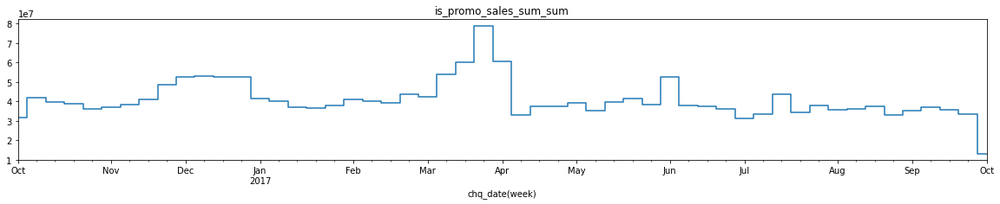

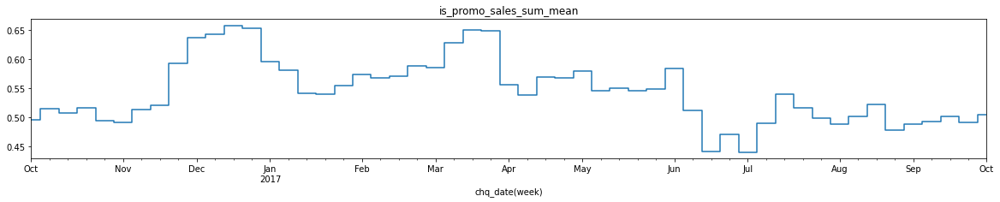

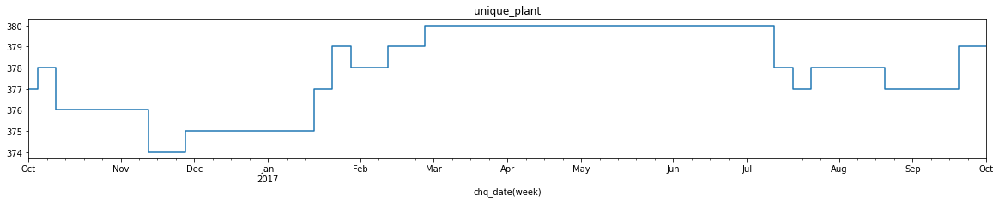

CPU times: user 10min 12s, sys: 14.2 s, total: 10min 26s
Wall time: 10min 26s


In [26]:
%%time
# Создаем различные варианты агрегаций времени
# Неделя

df['chq_date(week)'] = df['chq_date'].apply(lambda dt: dt - timedelta(days=dt.weekday()))

print('Графики по неделям')
df_temp = df.groupby('chq_date(week)').apply(get_time_features)
## Подневно
for key in df_temp.keys():
    df_temp[key].plot(figsize = (20, 3), 
                      title = key,
                      drawstyle ="steps-mid")
    plt.show()

#### По дням недели (понедельник, вторник, ...)

Графики по дням недели


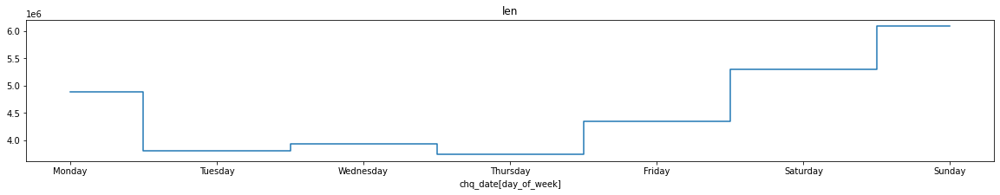

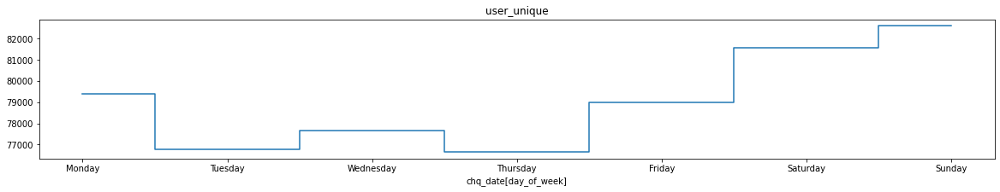

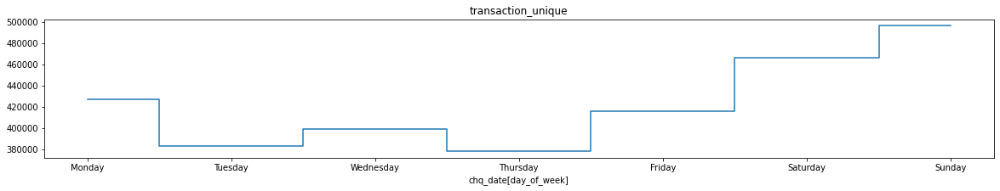

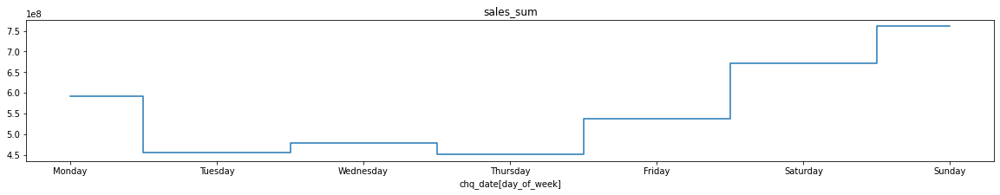

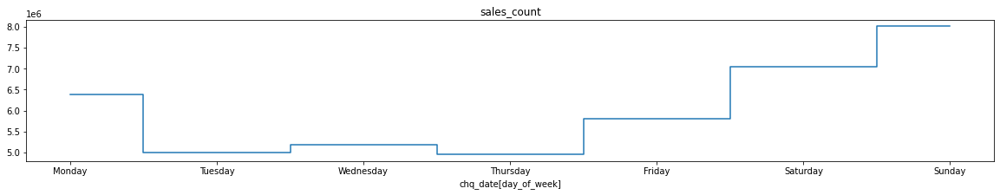

...

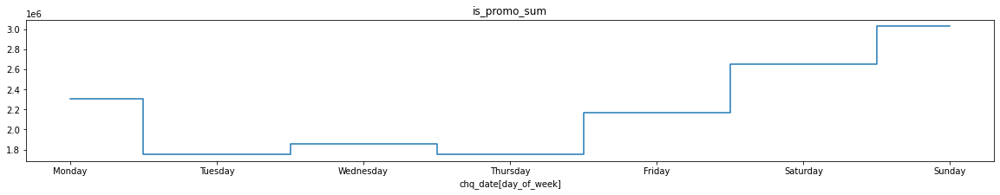

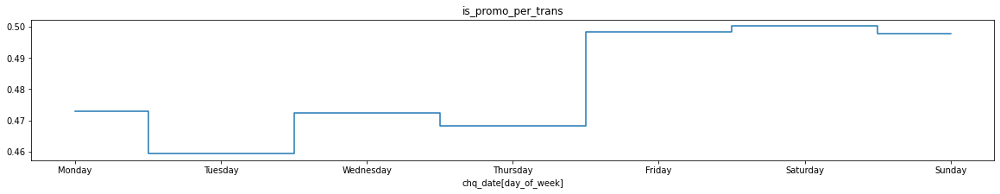

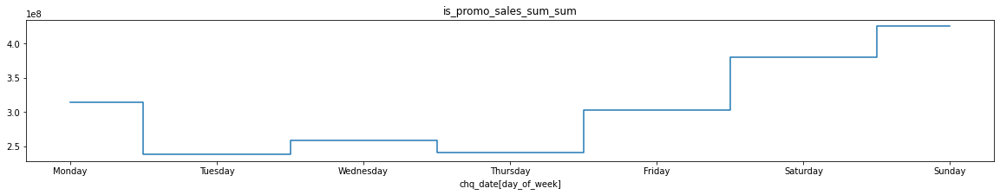

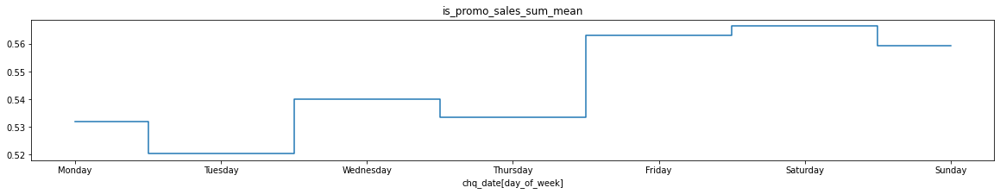

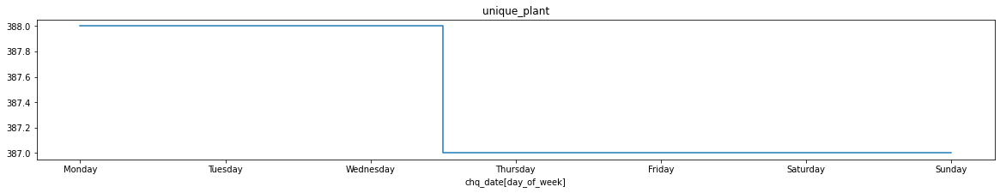

CPU times: user 41.5 s, sys: 4.19 s, total: 45.7 s
Wall time: 45.6 s


In [27]:
%%time
# Создаем различные варианты агрегаций времени
# День нелели

day_of_week_list = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# df['chq_date[day_of_week]'] = df['chq_date'].dt.dayofweek#.apply(lambda x:day_of_week_list[x])
print('Графики по дням недели')
df_temp = df.groupby('chq_date[day_of_week]').apply(get_time_features)
## Подневно
for key in df_stat.keys():
    df_temp[key].plot(figsize = (20, 3), 
                      title = key, 
                      drawstyle ="steps-mid"
                     )
    
    plt.xticks(range(0, len(day_of_week_list)), day_of_week_list)
    plt.show()

##### Выводы:
- Есть сильная зависимость по дням недели, в выходные клиентов сильно больше.
  Понедельник и пятница - более прибыльные дни (все готовятся в выходным или забыли что-то купить на выходных)
  
- На выходных люди покупают на 6% больше товаров по акции.

- Сезонная зависимость слабая

- Что-то интересное случилось в апреле, до него был сильный подъем, после него сильный спад
  > Скорее всего данные были амбусцированны(Сдвинуты вперед на x лет + 5 месяцев) и это новый год, так как в декабре-январе нет такого пика.
    
- В целом есть слабый тренд на понижении выручки
  > Возможно это связано с особенностью формирования данных
    (в выборку попали только клиенты пришедшие до 2017-01-03, они естественным образом убывают, а нового притока нет)


### Посмотрим на выручку по различным магазинам по периодам

In [28]:
def draw2plot(l1 = "2017-01-01",
              r1 = "2017-02-01",
              l2 = "2017-03-01",
              r2 = "2017-04-01", 
              name_str = "sales_sum"
             ):

    l = pd.to_datetime(l1)
    r = pd.to_datetime(r1)

    df0 = df[(df['chq_date']<r) & (df['chq_date']>l) ]

    l = pd.to_datetime(l2)
    r = pd.to_datetime(r2)


    df1 = df[(df['chq_date']<r) & (df['chq_date']>l) ]

    a = df0.groupby('plant')[[name_str]].sum().sort_values(name_str, ascending = False).rename(columns = {name_str:'first'})#.reset_index()
    b = df1.groupby('plant')[[name_str]].sum().sort_values(name_str, ascending = False).rename(columns = {name_str:'last'})#.reset_index()

    print(f"Number of stores 1: {len(a)}, 2: {len(b)}")
    
    df_store_stat = pd.merge(a, 
                             b, 
                             how = 'outer',
                             on  = 'plant')

    plt.figure(figsize = (10, 10))
    plt.scatter(df_store_stat['first'], df_store_stat['last'])
    t = max(df_store_stat['first'])
    plt.plot([0, t], [0, t], color = 'red', linestyle = '--', linewidth = 5, alpha = 0.5)
    plt.title(f'{name_str} sum', size = 22)
    plt.ylabel(f'last  month [{l1};{r1}]', size = 18)
    plt.xlabel(f'first month [{l2};{r2}]', size = 18)
    plt.show()


Number of stores 1: 377, 2: 380


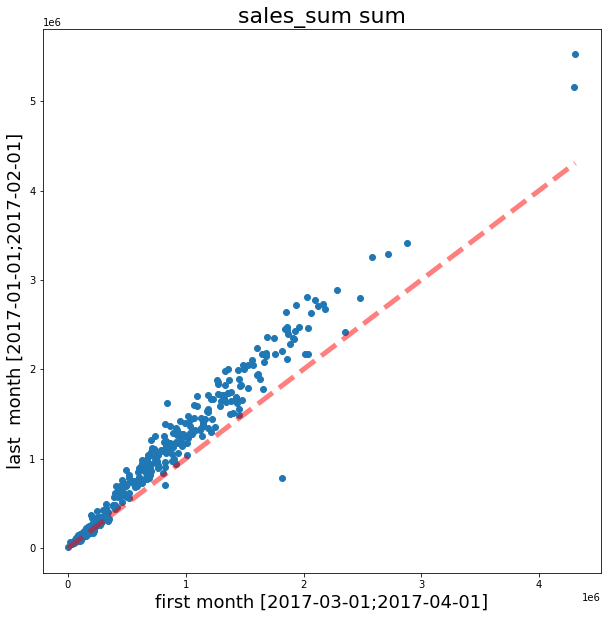

In [29]:
draw2plot(l1 = "2017-01-01",
          r1 = "2017-02-01",
          l2 = "2017-03-01",
          r2 = "2017-04-01")

Number of stores 1: 380, 2: 380


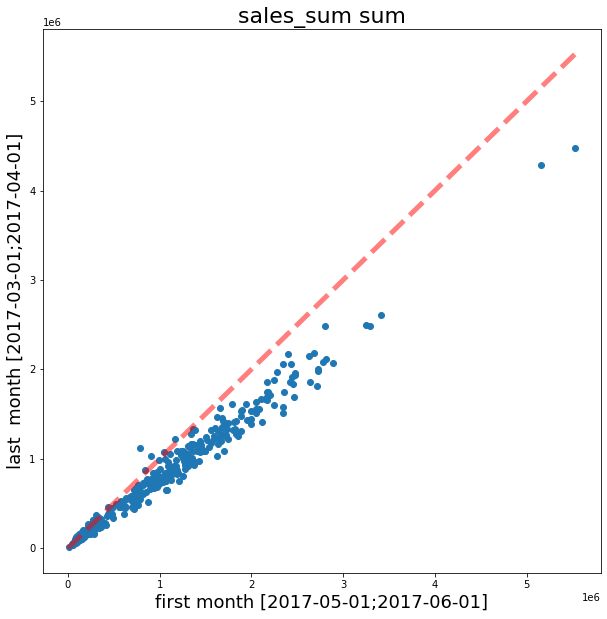

In [30]:
draw2plot(l1 = "2017-03-01",
          r1 = "2017-04-01",
          l2 = "2017-05-01",
          r2 = "2017-06-01")

Number of stores 1: 385, 2: 383


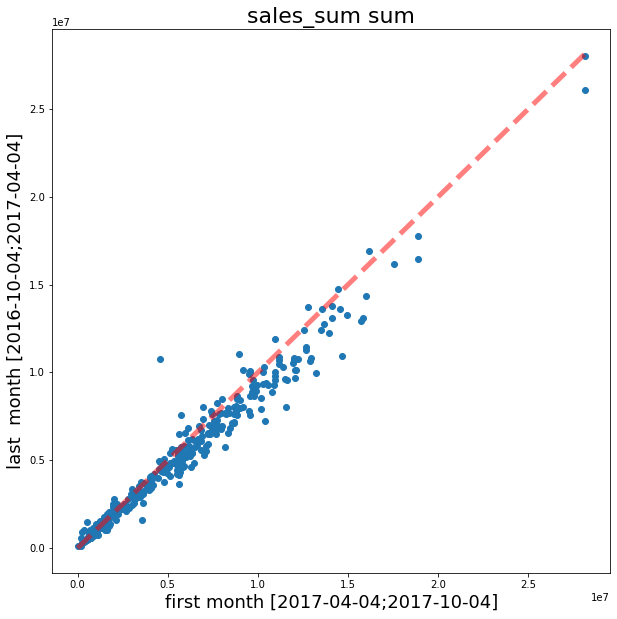

In [31]:
draw2plot(l1 = "2016-10-04",
          r1 = "2017-04-04",
          l2 = "2017-04-04",
          r2 = "2017-10-04")

#### Выводы
> Выбросов мало, все магазины ведут себя похожим образом

#### Странно, но в выборке есть негативные транзакции

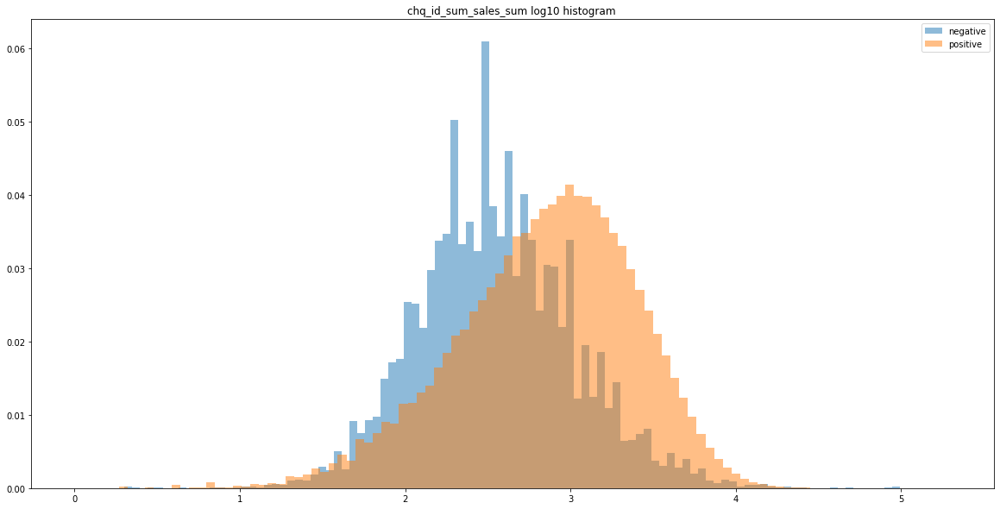

In [32]:
o = df.drop_duplicates('chq_id')
plt.figure(figsize = (20, 10))
o_current = o.loc[o['chq_id_sum_sales_sum']<0, 'chq_id_sum_sales_sum'].apply(lambda x:np.log10(1-x))
w = np.ones(len(o_current))/len(o_current)
plt.hist(o_current, weights=w, bins = 100, label = 'negative', alpha = 0.5)
plt.title('chq_id_sum_sales_sum log10 histogram ')

o_current = o.loc[o['chq_id_sum_sales_sum']>=0, 'chq_id_sum_sales_sum'].apply(lambda x:np.log10(1+x))
w = np.ones(len(o_current))/len(o_current)
plt.hist(o_current, weights=w, bins = 100, label = 'positive', alpha = 0.5)
plt.legend()
plt.show()

# В логарифмических осях построить распределение chq_id_sum_sales_sum, должно выйти лог-нормальное распределение

> Возможно, это отмена покупки?

Средняя сумма транзакции -- около 1000 руб

### Как выглядят сумма положительных и отрицательных чеков по дням

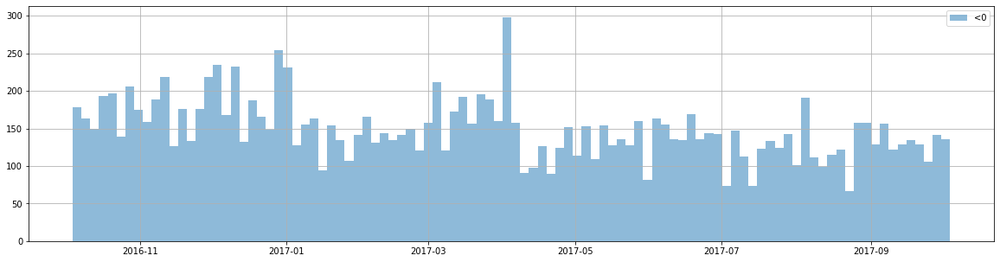

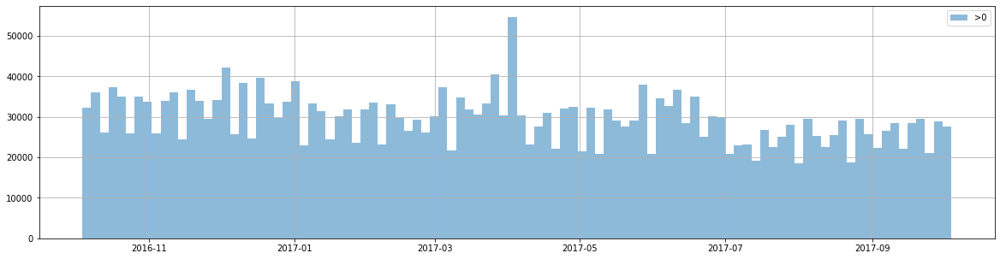

In [33]:
df.loc[df['chq_id_sum_sales_sum']<0].drop_duplicates('chq_id')['chq_date'].hist(label = '<0', figsize = (20, 5), alpha = 0.5, bins = 100)
plt.legend()
plt.show()

df.loc[df['chq_id_sum_sales_sum']>=0].drop_duplicates('chq_id')['chq_date'].hist(label = '>0', figsize = (20, 5),alpha = 0.5, bins = 100)
plt.legend()
plt.show()

In [34]:
# Правда ли, что нет транзакций в которых есть и отрицательные и положительные чеки?
# Проверим, что это отмена
print('<0 correct', (df.loc[df['chq_id_sum_sales_sum']<0, 'sales_sum']<0).all())
print('>0 correct', (df.loc[df['chq_id_sum_sales_sum']>0, 'sales_sum']>0).all())
# > Да

<0 correct True
>0 correct True


In [35]:
df.loc[df['chq_id_sum_sales_sum']<0].sort_values('chq_id_sum_sales_sum')

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo,material__is_private_label,...,plant__is_city_Moscow,chq_id_sum_sales_count,chq_id_len,chq_id_sum_sales_sum,chq_id_material__is_private_label,chq_id_material__is_alco,chq_id_material__is_food,chq_date(month),chq_date(week),chq_date[day_of_week]
31431694,61b17e3843e880f6bd51324a8d94610e,c81c2b9e997a81f84838cd8e60b93a01,2016-10-21,001,596f837a638189cb15e9d4b144dd45c4,df61ac05dd83388e5b5c766cf4fcb312,-60.0,-98388.00,0,0.0,...,0,-60.0,1,-98388.00,0.0,1.0,1.0,2016-10-01,2016-10-17,4
31431709,cc50070834892c5348978d9d3f3c9cb5,c81c2b9e997a81f84838cd8e60b93a01,2016-10-21,003,596f837a638189cb15e9d4b144dd45c4,639744133763da589ad3055d293b9154,-48.0,-34236.00,0,0.0,...,0,-120.0,3,-95251.00,0.0,1.0,1.0,2016-10-01,2016-10-17,4
31431699,cc50070834892c5348978d9d3f3c9cb5,c81c2b9e997a81f84838cd8e60b93a01,2016-10-21,002,596f837a638189cb15e9d4b144dd45c4,ec13cc81075855dfe31e2fb8116344ed,-4.0,-3389.76,0,0.0,...,0,-120.0,3,-95251.00,0.0,1.0,1.0,2016-10-01,2016-10-17,4
31431690,cc50070834892c5348978d9d3f3c9cb5,c81c2b9e997a81f84838cd8e60b93a01,2016-10-21,001,596f837a638189cb15e9d4b144dd45c4,ec13cc81075855dfe31e2fb8116344ed,-68.0,-57625.24,0,0.0,...,0,-120.0,3,-95251.00,0.0,1.0,1.0,2016-10-01,2016-10-17,4
31431703,af2b422068ed54af49ef0275520314a7,c81c2b9e997a81f84838cd8e60b93a01,2016-10-21,003,596f837a638189cb15e9d4b144dd45c4,df61ac05dd83388e5b5c766cf4fcb312,-10.0,-16398.00,0,0.0,...,0,-100.0,3,-94689.00,0.0,1.0,1.0,2016-10-01,2016-10-17,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17187510,113e16efd4d3653ea360ba14fab7c1e0,56c66132e67551c55b1667f9b14de886,2017-04-05,001,18b4bee65b54e69f28ec71c4e49660d2,e157c57ca48445c18680a86767f4c997,-1.0,-1.37,1,0.0,...,0,-1.0,1,-1.37,0.0,0.0,1.0,2017-04-01,2017-04-03,2
28010290,caba8f8f97354ffaaccf5d9ff9a42a92,2ebe25dd3a566f36f80d55440d3c3834,2017-08-19,001,806aa67e23892d029172d4347da3310a,d24abc923a61543ffc13ccace7cb5da4,-1.0,-1.00,1,0.0,...,0,-1.0,1,-1.00,0.0,0.0,0.0,2017-08-01,2017-08-14,5
28241201,83549160c46d0cabdea5abdf7ee7171b,2d0974b2436345d99f7152c3fc44a609,2017-08-25,001,d3b66ff3c56a962b5b4146d46a6940be,d3e97c413ab082ba9e5fe06d053e9f25,-1.0,-1.00,0,0.0,...,0,-1.0,1,-1.00,0.0,0.0,1.0,2017-08-01,2017-08-21,4
14176442,f50e725f14a879adb1d173467f4cf560,62a8d042a93d5f88fb6636cde700ce69,2017-04-04,001,35be5e61ba319475211d55cd64ffcc5e,cfe5b2573c75bb74848a1ae7da2e628a,-1.0,-1.00,1,0.0,...,0,-1.0,1,-1.00,0.0,0.0,1.0,2017-04-01,2017-04-03,1


#### Если это отмена, попробуем найти отмененные покупки в базе

In [36]:
df.loc[df['chq_id_sum_sales_sum']<0]["chq_id_sum_sales_sum"].value_counts()

-300.00      99
-199.00      85
-7211.00     80
-99.99       78
-23036.00    78
             ..
-141.26       1
-1998.84      1
-848.31       1
-155.29       1
-812.35       1
Name: chq_id_sum_sales_sum, Length: 10611, dtype: int64

In [37]:
df.loc[df['chq_id_sum_sales_sum']==-1.37]

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo,material__is_private_label,...,plant__is_city_Moscow,chq_id_sum_sales_count,chq_id_len,chq_id_sum_sales_sum,chq_id_material__is_private_label,chq_id_material__is_alco,chq_id_material__is_food,chq_date(month),chq_date(week),chq_date[day_of_week]
17187510,113e16efd4d3653ea360ba14fab7c1e0,56c66132e67551c55b1667f9b14de886,2017-04-05,001,18b4bee65b54e69f28ec71c4e49660d2,e157c57ca48445c18680a86767f4c997,-1.0,-1.37,1,0.0,...,0,-1.0,1,-1.37,0.0,0.0,1.0,2017-04-01,2017-04-03,2


In [38]:
df.loc[df['chq_id_sum_sales_sum']==1.37]

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo,material__is_private_label,...,plant__is_city_Moscow,chq_id_sum_sales_count,chq_id_len,chq_id_sum_sales_sum,chq_id_material__is_private_label,chq_id_material__is_alco,chq_id_material__is_food,chq_date(month),chq_date(week),chq_date[day_of_week]


##### Нет 

In [39]:
df.loc[df['chq_id_sum_sales_sum']==-112]

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo,material__is_private_label,...,plant__is_city_Moscow,chq_id_sum_sales_count,chq_id_len,chq_id_sum_sales_sum,chq_id_material__is_private_label,chq_id_material__is_alco,chq_id_material__is_food,chq_date(month),chq_date(week),chq_date[day_of_week]
825990,7ffda6e6cc1bec49b4547bbece727405,6296580f0889e341dd9ba0992333171d,2016-11-29,001,acbddf27bbb1c126812778a31be6f899,53e12736b59eb0964e1d14d7cdabcded,-0.28,-112.0,0,0.0,...,0,-0.28,1,-112.0,0.0,0.0,1.0,2016-11-01,2016-11-28,1


In [40]:
df.loc[(df['chq_id_sum_sales_sum']==112) & (df['client_id']=='acbddf27bbb1c126812778a31be6f899')]

,chq_id,plant,chq_date,chq_position,client_id,material,sales_count,sales_sum,is_promo,material__is_private_label,...,plant__is_city_Moscow,chq_id_sum_sales_count,chq_id_len,chq_id_sum_sales_sum,chq_id_material__is_private_label,chq_id_material__is_alco,chq_id_material__is_food,chq_date(month),chq_date(week),chq_date[day_of_week]


### Первичная подготовка признаков

In [41]:
%%time

def diff_to_days(x):
    return x / np.timedelta64(1, 's') / 60 / 60 / 24

def _get_features(data):
    data_no_duplicates = data.drop_duplicates("chq_id")
    data_negative      = data[data['sales_sum']<0]
    
    t_list = list(sorted(data_no_duplicates['chq_date'].unique()))
    deltas = diff_to_days(np.diff(t_list)) #интервалы между датами транзакций
    bins = [0, 1, 7, 14, 21, 28, 56, 112, 224, 448]
    res = {
           't_min'  : data['chq_date'].min(),          # Даты (первая, последняя и весь список)
           't_max'  : data['chq_date'].max(),  
           '_t_list' : t_list,
        
           'items_N' : data['chq_id'].nunique(),              # Количество пробитых товаров
           'items_sales_sum_sum':data['sales_sum'].sum(),     # Сколько потратил
           'items_sales_count_sum':data['sales_count'].sum(), # Сколько покупок сделал

           'items_N_negative' : data_negative['chq_id'].nunique(),              # Количество пробитых товаров
           'items_sales_sum_sum_negative':data_negative['sales_sum'].sum(),     # Сколько потратил
           'items_sales_count_sum_negative':data_negative['sales_count'].sum(), # Сколько покупок сделал
           
           "item_price_mean" : data['chq_id_sum_sales_count'].mean(), # Средняя цена товара
           "item_price_max"  : data['chq_id_len'].max(),              # Максимальная цена товара
           "item_price_min"  : data['chq_id_sum_sales_sum'].min(),    # Минимальная цена товара
           
        
           'chq_id_sum_sales_count_mean':data_no_duplicates['chq_id_sum_sales_count'].mean(),   # Средний количество покупок
           'chq_id_len_mean':data_no_duplicates['chq_id_len'].mean(),                           # Средее количнтво товаров
           'chq_id_sum_sales_sum_mean':data_no_duplicates['chq_id_sum_sales_sum'].mean(),       # Средняя цена товаров
                   
           'chq_id_sum_sales_count_min':data_no_duplicates['chq_id_sum_sales_count'].min(),  # То-же самое для минимума
           'chq_id_len_min':data_no_duplicates['chq_id_len'].min(),
           'chq_id_sum_sales_sum_min':data_no_duplicates['chq_id_sum_sales_sum'].min(),
            
           
           'chq_id_sum_sales_count_max':data_no_duplicates['chq_id_sum_sales_count'].max(), # То-же самое для максимума
           'chq_id_len_max':data_no_duplicates['chq_id_len'].max(),
           'chq_id_sum_sales_sum_max':data_no_duplicates['chq_id_sum_sales_sum'].max(),
        
           'promo_rate_count': (data['is_promo']==1).mean(),    # Доля промо
           'promo_rate_sales_sum': (data.loc[(data['is_promo']==1), 'sales_sum'].sum()+1)/(data['sales_sum'].sum()+1),
           'promo_rate_sales_count': (data.loc[(data['is_promo']==1), 'sales_count'].sum()+1)/(data['sales_count'].sum()+1),
        
            "delta_median" : np.median(deltas) if len(deltas)>0 else np.nan, # 
            "delta_min"    : np.min(deltas) if len(deltas)>0 else np.nan,
            "delta_max"    : np.max(deltas) if len(deltas)>0 else np.nan,
            "delta_std"    : np.std(deltas) if len(deltas)>0 else np.nan,
            "delta_moda"   : np.argmax(np.bincount(deltas.astype(int))) if len(deltas)>0 else np.nan,
          }
    
    # Позитивные транзакции
    res['items_N_positive']               = res['items_N']-res['items_N_negative']
    res['items_sales_sum_sum_positive']   = res['items_sales_sum_sum']-res['items_sales_sum_sum_negative']
    res['items_sales_count_sum_positive'] = res['items_sales_count_sum']-res['items_sales_count_sum_negative']
    
    
    # Отношение негативного к позитивному
    ##res['negative_pos_rate_len_positive'] = res['negative_pos_rate_len']  -res['negative_pos_rate_len_negative']  
    for l in range(1, len(bins)):
        res[f'delta_bin_{bins[l-1]}_{bins[l],}'] = np.mean([((bins[l-1]<=x) and (x<bins[l]))  for x in deltas])
    
    
    for c in range(2):
        res[f'plant_key_{c}'] = np.nan
        res[f'plant_val_{c}'] = np.nan 
        res[f'material_key_{c}'] = np.nan
        res[f'material_val_{c}'] = np.nan 
        
    # Самые популярные города по количеству и из доля
    for c, (key, val) in enumerate(data_no_duplicates['plant'].value_counts(True).to_dict().items()):
        if c>=2:
            break

        res[f'plant_key_{c}'] = key
        res[f'plant_val_{c}'] = val     
    #два топовых магазина для юзера
        
    # Самые популярные товары по количеству и из доля    
    for c, (key, val) in enumerate(data['material'].value_counts(True).to_dict().items()):
        if c>=2:
            break
            
        res[f'material_key_{c}'] = key
        res[f'material_val_{c}'] = val  
    
    # Добавить join на metrials из таблицы 'materials.txt'
    # Добавить join на plant из таблицы пользователей если для каждого магазина взять максимальное количество пользователей с городом, это должно помоч
    
    return pd.Series(res)  

# _get_features(df[:100])
# user_sample = ["1a47d62dddacc03fe90c15652f7ae1a4"]#df['client_id'].sample(5000, random_state = 42).to_numpy()
# res = df[df['client_id'].isin(user_sample)].groupby('client_id').apply(_get_features)
# res
df_client = df.groupby('client_id').apply(_get_features)
# df_client['client_id'] = df_client.index
# print('Finish calculating')

df_client.to_parquet("results/df_client_id.parquet")
# df_client

/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-p

CPU times: user 23min 35s, sys: 12.2 s, total: 23min 47s
Wall time: 23min 44s


In [42]:
df_client.head()

,t_min,t_max,_t_list,items_N,items_sales_sum_sum,items_sales_count_sum,items_N_negative,items_sales_sum_sum_negative,items_sales_count_sum_negative,item_price_mean,...,"delta_bin_112_(224,)","delta_bin_224_(448,)",plant_key_0,plant_val_0,material_key_0,material_val_0,plant_key_1,plant_val_1,material_key_1,material_val_1
client_id,,,,,,,,,,,,,,,,,,,,,
0000d48a8891cd462fdf01ea861ec53e,2016-10-31,2017-08-31,"[2016-10-31T00:00:00.000000000, 2016-11-20T00:...",40,85898.00,966.731,1,-249.00,-1.0,29.579307,...,0.0,0.0,6858fb45a3d3aef7c29322d3b68dffd1,0.625000,40f96e886f80e25f241b1781a2543157,0.037338,7f8bb0fe8b33780a08fe6b60ced14529,0.375000,254f1eba1181248807d128842b566bf9,0.032468
00028a1dcb30863404a386961a69300e,2016-10-09,2017-09-15,"[2016-10-09T00:00:00.000000000, 2016-10-20T00:...",34,51916.00,470.427,0,0.00,0.0,23.418793,...,0.0,0.0,585869cdf36ea981c9545fcfef880f1d,0.588235,b75147feae4cf8ec07fb5f2cef855def,0.059585,e7c1d363fdf4c85ee426f767361eabf9,0.205882,f659b68a28a0b9abf44d0d3467a8f949,0.020725
0004274683494a9eca5e70ef97299d55,2016-10-04,2017-10-04,"[2016-10-04T00:00:00.000000000, 2016-10-05T00:...",169,101130.00,1407.353,0,0.00,0.0,11.373868,...,0.0,0.0,5359c847ef4975cdc646e8be8cb5621f,0.644970,6eaa9bd12a43a4d79badd51a62ac3d76,0.055833,78c734ebceead5b7b07ffd1414b22eed,0.349112,8726f99aa703c86e77082909317187d9,0.036667
00072f81efcb3481861f7300c5e2a88a,2016-10-29,2017-09-07,"[2016-10-29T00:00:00.000000000, 2016-11-17T00:...",8,5125.00,44.596,0,0.00,0.0,8.663586,...,0.0,0.0,b03a75fccca587a511170aa5b7952210,1.000000,0f40df203ca44f40e44b07f57f90fa91,0.103448,NaN,NaN,1ca29358e90bb3570790b23213edb7fe,0.068966
00076596eb749cf10c2e984621dffe95,2016-10-05,2017-10-04,"[2016-10-05T00:00:00.000000000, 2016-10-06T00:...",166,203833.46,3160.780,1,-249.54,-1.0,28.274646,...,0.0,0.0,47f91082e4cc7d6d0fcf49d5aa6f3711,0.987952,6278f48a43fb0a23036b3a11c92e726c,0.071996,2c393e45170ca8e02cc1b670e799da1b,0.012048,0e31ad075d99fab63be09dad89580d71,0.040206


##### Среднии чеки (положительные и отрицательные)

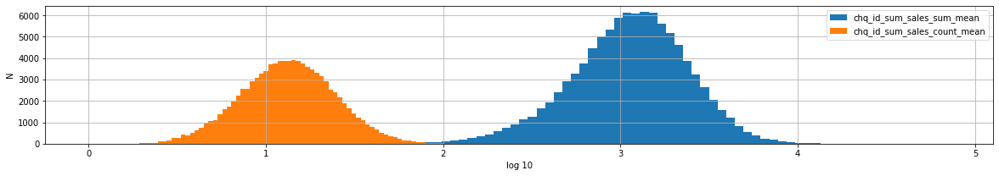

In [43]:
df_client['chq_id_sum_sales_sum_mean'].apply(lambda x: np.log10(1+x)).hist(figsize = (20, 3), 
                                                                            bins = 100, 
                                                                            label = 'chq_id_sum_sales_sum_mean')
plt.xlabel("log 10")
plt.ylabel("N")



#Среднее количество товаров в чеке на клиента, усредненные по клиентам
df_client['chq_id_sum_sales_count_mean'].apply(lambda x: np.log10(1+x)).hist(figsize = (20, 3), 
                                                                             bins = 100,
                                                                             label = 'chq_id_sum_sales_count_mean')


plt.legend()
plt.show()


In [44]:
t_data_start = df_client['t_min'].max()
t_data_start

Timestamp('2017-01-03 00:00:00')

> В выбороке есть только клиенты которые присоедениелись к программе лояльности 2017-01-03
  За 9 месяцев до финальной даты

In [45]:
df_client_raw = pd.read_csv('clients.csv')
print('df_client_raw.shape', df_client_raw.shape)
df_client_raw.head()

df_client_raw.shape (99995, 4)


,client_id,gender,city,birthyear
0,1a47d62dddacc03fe90c15652f7ae1a4,M,Other,1990.0
1,9cb909f701d25d548e953bff81192b56,F,Other,1969.0
2,d5da0f5b841b4f83383202807995027a,M,Other,1976.0
3,13ed7f16810b17b8cee6de834ac79a48,F,Moscow,1966.0
4,215fe3ea7d5bf0415e5504e2a7f33551,F,Other,1988.0


In [46]:
# Сколько уникальных элементов, что за тип
for key in df_client_raw.keys():
    print(f"{key} {' '*(20-len(key))}  {df_client_raw[key].nunique()} \t {df_client_raw[key].dtype} \t {df_client_raw[key].isna().sum()}")

client_id              99995 	 object 	 0
gender                 2 	 object 	 355
city                   3 	 object 	 0
birthyear              107 	 float64 	 1776


In [47]:
df_client['client_id'] = df_client.index.tolist()

#### Странно, но куда-то пропали 5 пользователей
(это очень мало относительно 10e4, не будем никак это учитывать)

In [48]:
df_client[~df_client['client_id'].isin(df_client_raw['client_id'].unique())]

,t_min,t_max,_t_list,items_N,items_sales_sum_sum,items_sales_count_sum,items_N_negative,items_sales_sum_sum_negative,items_sales_count_sum_negative,item_price_mean,...,"delta_bin_224_(448,)",plant_key_0,plant_val_0,material_key_0,material_val_0,plant_key_1,plant_val_1,material_key_1,material_val_1,client_id
client_id,,,,,,,,,,,,,,,,,,,,,
3ff5567abe9de12b87180220deec0311,2016-10-11,2017-09-01,"[2016-10-11T00:00:00.000000000, 2016-10-12T00:...",20,20427.0,239.732,0,0.0,0.0,16.725905,...,0.0,5968996e0aca329cf3218086223f8308,0.60,4417aec68c5c2537f22c8c36d696d6b3,0.028571,29150bb2319c182c944841c74d2f8d75,0.350,b75147feae4cf8ec07fb5f2cef855def,0.028571,3ff5567abe9de12b87180220deec0311
6d6857d997aea7ddee6107734bf1acfd,2016-10-04,2017-09-22,"[2016-10-04T00:00:00.000000000, 2016-10-26T00:...",25,83003.0,997.465,0,0.0,0.0,61.309044,...,0.0,3d842a955f86c5982f18ed6fea9fa1a9,0.64,6278f48a43fb0a23036b3a11c92e726c,0.016327,c3b86052d1fc94bd11c279a17f3f25e1,0.240,3bafe05aabf85a888d85a966fb853ebf,0.014966,6d6857d997aea7ddee6107734bf1acfd
94bf299e419de3e1d359e67d8868dc43,2016-11-23,2017-03-21,"[2016-11-23T00:00:00.000000000, 2016-11-28T00:...",10,10861.0,144.130,0,0.0,0.0,16.244503,...,0.0,a9b2b0ce7799c4de9c7a3aed9ebeddeb,0.80,23f552a9126cedd94df4a760107773de,0.040816,5e9167571c4fdf5f5bceabb11ca7d4c9,0.100,4912c22ae99f53aae360459733bf5e97,0.034014,94bf299e419de3e1d359e67d8868dc43
d6e77dc47ead0049e5be7f6f4330cee2,2016-10-14,2017-08-23,"[2016-10-14T00:00:00.000000000, 2016-10-31T00:...",10,18716.0,160.482,0,0.0,0.0,20.566309,...,0.0,a4e23b2609285cfd99de6d9832f21df1,1.00,808c99c5030afc5da6586192eef04453,0.026846,NaN,NaN,e12f143279e2ac09f63f29bebe99ce9f,0.020134,d6e77dc47ead0049e5be7f6f4330cee2
f284fc3143decf0ef4f93d7e75e5d6d0,2016-10-15,2017-09-26,"[2016-10-15T00:00:00.000000000, 2016-10-16T00:...",40,40030.0,486.471,0,0.0,0.0,18.958291,...,0.0,857778a20b9a41d4ca0d687a36e4bfa8,0.85,dd040b62c01930efe45d65c4e5ac754b,0.026667,540bd55a2cf295b8ea9cd78650e89d03,0.125,142d63107737a448dc2dfe2dcd0154b8,0.024000,f284fc3143decf0ef4f93d7e75e5d6d0


#### Обьединим таблицы

In [49]:
df_client = df_client.join(df_client_raw.set_index("client_id"))

### Посмотрим на частоту походов клиетов в магазин

In [50]:
#рисует пользовательскую траекторию для n клиентов

def _print_user_times(N = 20, fn_out = None):
    user_sample = df_client['client_id'].sample(N, random_state = 42).to_numpy()

    o = df_client.loc[df_client['client_id'].isin(user_sample)]#, "_t_list"]
    y_ticks = []
    plt.figure(figsize = (20, 10))
    plt.title('User datetimes', fontsize = 22)
    plt.xlabel('time',    fontsize = 16)
    plt.ylabel('user_id', fontsize = 16)
    
    for c, (cliend_id, data) in enumerate(o.sort_values('t_max').iterrows()):
        x_list = data['_t_list']#.to_numpy()
        y_list = [c+1] * len(x_list)


        plt.scatter(x_list, 
                    y_list, 
                    s = 10,
                    marker = 'o')

        y_ticks.append(data['client_id'])

    plt.yticks(list(range(1, 1+len(y_ticks))), y_ticks)
    plt.plot([t_data_start, t_data_start], 
             [0, N+1], 
             label = f't_start = {t_data_start}',
             color = 'red', 
             linestyle = '--', 
             linewidth = 5,
             alpha = 0.2)

    plt.ylim(0, N+1)
    
    plt.legend(loc = "lower right", fontsize = 18)
    plt.grid()
    
    if fn_out is not None:
        plt.savefig(fn_out)
    
    plt.show()

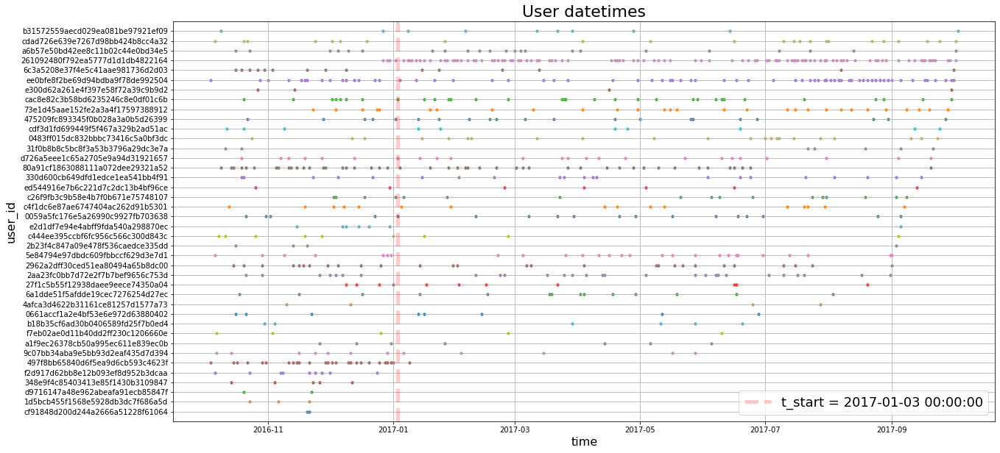

In [51]:
_print_user_times(40, fn_out = "results/users_datetime_40")

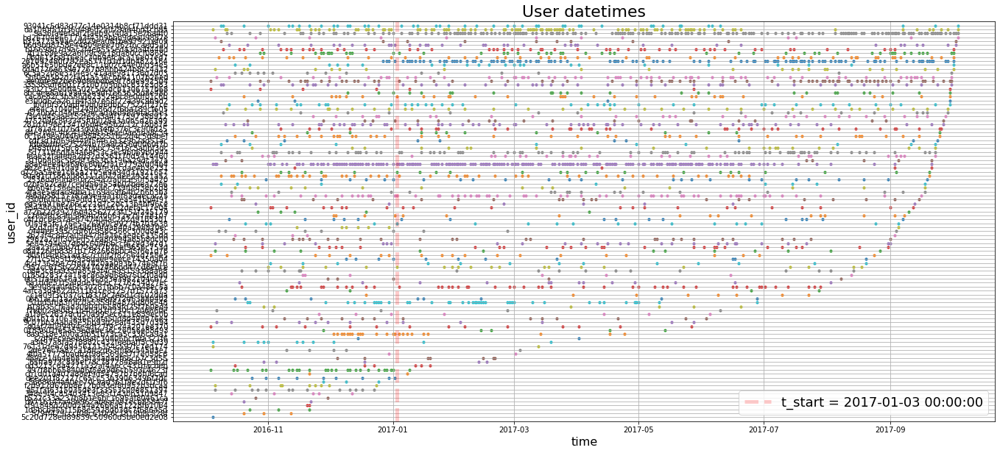

In [52]:
_print_user_times(100, fn_out = "results/users_datetime_100")

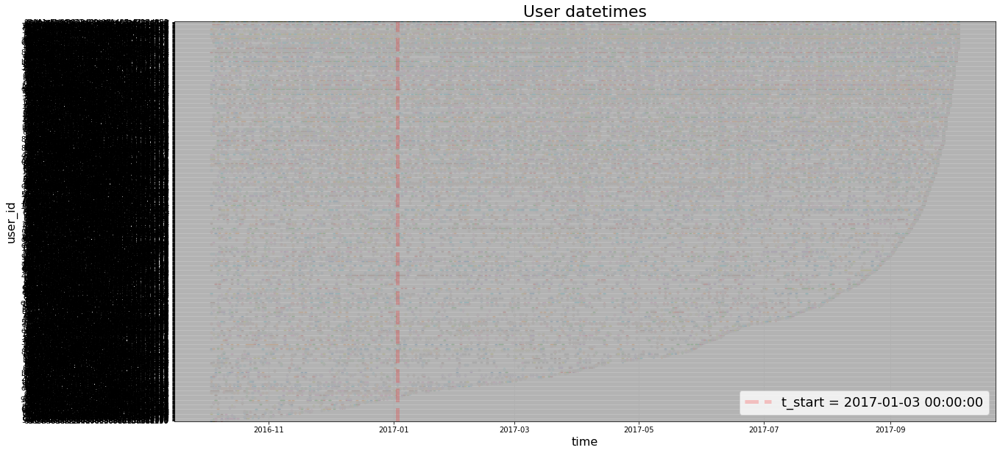

In [53]:
_print_user_times(1000, fn_out = "results/users_datetime_1000")

# 2. Разработка методологии

##### Определения
Есть два вида клиентов: оставшися и ушедшие (churn).

Берутся две отсечки по времени (t1  и t2, t1<t2), рассматриваются те клиенты, которые имеют хотя бы одну транзакцию после времени t1. 
Клиент, имевший хотя бы одну транзакцию после момента  времени t2, называется оставшимся, в ином случае клиент называется ушедшим.

##### Как будем выделять t1,t2 ?

Для определения резонных значений переменных t1 и t2 построим зависимость доли ушедших клиентов от всех (от тех, которых мы учитываем для этой пары времен). 
Baseline модель будем строить по методу логистической регрессии. 

#### Схема валидации
Также существует альтернативная версия валидации со временем: вместо разделения выборке на train и test решим задачу для двух разных пар времен t1 и t2. Исходя из предположения об относительном постоянстве паттернов данных, валидируем модель сравнением с выборкой данных, смещенных в прошлое на небольшой интервал. Этот подход может позволить обучить итоговую модель на всем корпусе данных.

Для оценки финального результата используются метрики ROC-AUC и precision-recall curve. Последняя из них нам актуальна, так как лучше интерпретируется с позиций бизнеса.


###  Как часто в среднем ходят в Ленту?


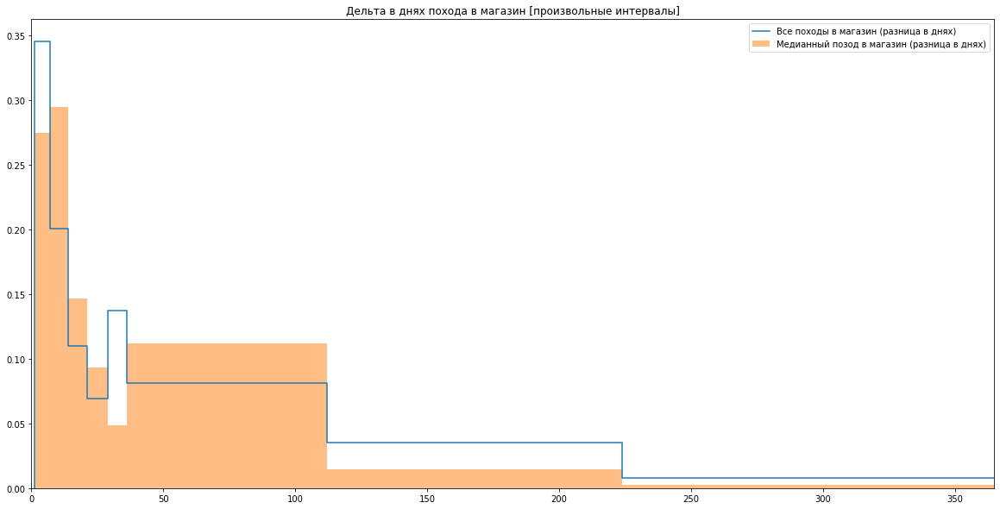

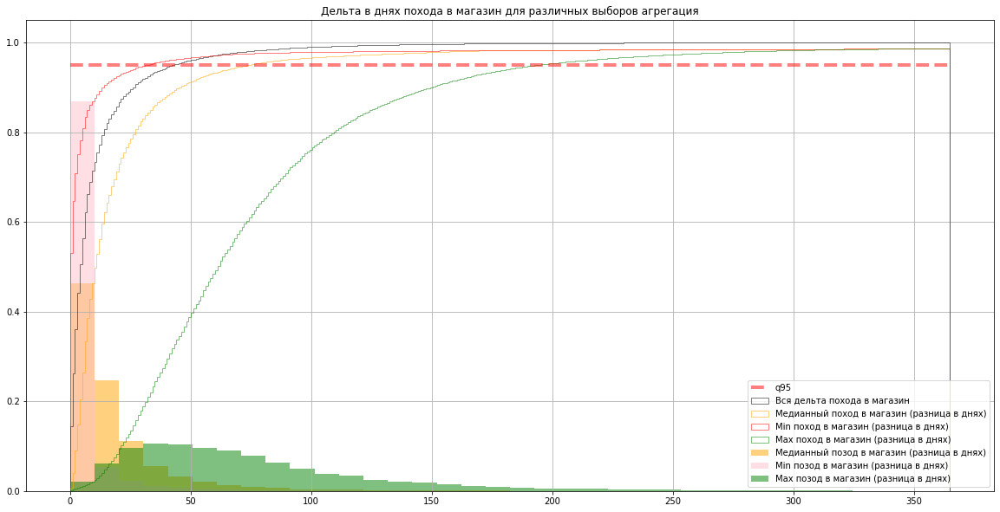

In [54]:
N = len(df_client)#.keys()
o = (df_client[['delta_bin_0_(1,)', 'delta_bin_1_(7,)', 'delta_bin_7_(14,)',
                'delta_bin_14_(21,)', 'delta_bin_21_(28,)', 'delta_bin_28_(56,)',
                'delta_bin_56_(112,)', 'delta_bin_112_(224,)', 'delta_bin_224_(448,)']].sum(axis = 0)/N)

x_list = [1,7,14,21,29,36,112,224, 448]
# print(len(o), len(x_list))
plt.figure(figsize = (20, 10))
plt.title('Дельта в днях похода в магазин [произвольные интервалы]')

plt.step(x_list, o.to_numpy(), label = 'Все походы в магазин (разница в днях)')
plt.hist(df_client['delta_median'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, bins = [0]+x_list,
         label = 'Медианный позод в магазин (разница в днях)')

plt.legend()
plt.xlim(0, 365)
plt.show()

plt.figure(figsize = (20, 10))

plt.title('Дельта в днях похода в магазин для различных выборов агрегация')
bins = np.linspace(0, 365, 365)

all_t_list = []
for i in df_client['_t_list'].apply(np.diff).to_numpy():
    all_t_list.extend(i)
    
all_t_list = diff_to_days(all_t_list)

plt.hist(all_t_list,
         weights = np.ones(len(all_t_list))/len(all_t_list), 
         alpha = 0.5, 
         color = 'black',histtype='step',
         bins = bins, cumulative=1,
         label = 'Вся дельта похода в магазин')

plt.hist(df_client['delta_median'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'orange',histtype='step',
         bins = bins, cumulative=1,
         label = 'Медианный поход в магазин (разница в днях)')

plt.hist(df_client['delta_min'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'red',histtype='step',
         bins = bins, cumulative=1,
         label = 'Min поход в магазин (разница в днях)')

plt.hist(df_client['delta_max'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'green',histtype='step',
         bins = bins, cumulative=1,
         label = 'Max поход в магазин (разница в днях)')

bins = np.linspace(0, 365, 37)

plt.hist(df_client['delta_median'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'orange',
         bins = bins, 
         label = 'Медианный позод в магазин (разница в днях)')

plt.hist(df_client['delta_min'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'pink',
         bins = bins, 
         label = 'Min позод в магазин (разница в днях)')

plt.hist(df_client['delta_max'],
         weights = np.ones(len(df_client))/len(df_client), 
         alpha = 0.5, 
         color = 'green',
         bins = bins, 
         label = 'Max позод в магазин (разница в днях)')

plt.plot([0, 365], [0.95, 0.95],
         label = 'q95',
         linewidth = 4,
         linestyle = '--', 
         color = 'red', alpha = 0.5)
plt.grid()
plt.legend()
plt.show()

##### Из этого можно сделать вывод, что оптимальным значение t2-t1 должно лежать в диапазоне от 60 до 200 дней
##### Чтобы ошибка нашей разметки была порядка 5%


Для простоты положим t1-t2 = 60 дней (два месяца)

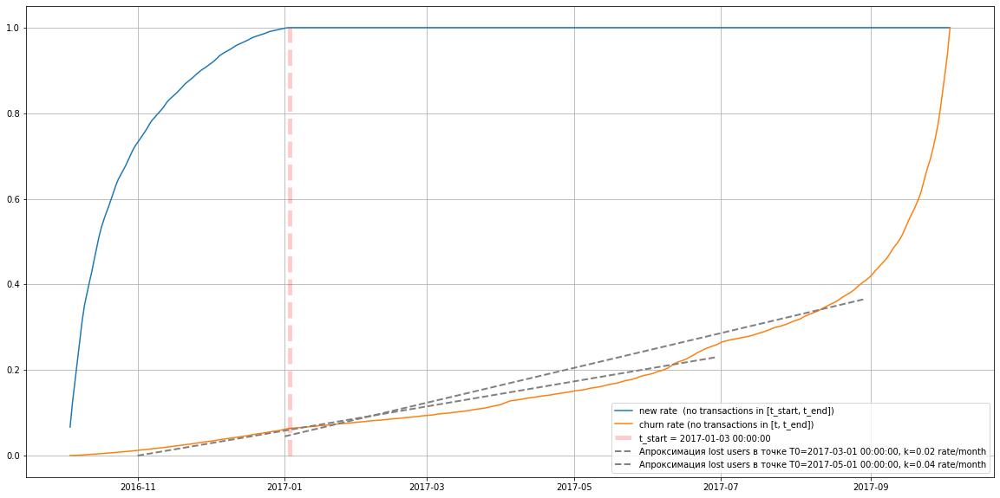

In [55]:
new_users   = []
lost_users = []
t_list = []
for t in list(sorted(df['chq_date'].drop_duplicates())):
    new_users.append((df_client['t_min']<=t).mean())
    lost_users.append((df_client['t_max']<=t).mean())
    t_list.append(t)
    
plt.figure(figsize = (20, 10))
plt.plot(pd.to_datetime(t_list), 
         new_users,  label = 'new rate  (no transactions in [t_start, t_end])')

plt.plot(pd.to_datetime(t_list), 
         lost_users, label = 'churn rate (no transactions in [t, t_end])')

plt.plot([t_data_start, t_data_start], 
         [0, 1], 
         label = f't_start = {t_data_start}',
         color = 'red', 
         linestyle = '--', 
         linewidth = 5,
         alpha = 0.2)

delta = 4
T0 = pd.to_datetime("2017-03")
k = 0.02
plt.plot([T0-timedelta(30*delta), T0+timedelta(30*delta)], 
         [0.08-delta*k, 0.15+delta*k],
         linestyle = '--',
         color = 'grey',
         linewidth = 2,
         label = f"Апроксимация lost users в точке T0={T0}, k={k} rate/month")

delta = 4
T0 = pd.to_datetime("2017-05")
k = 0.04
plt.plot([T0-timedelta(30*delta), T0+timedelta(30*delta)], 
         [0.205-delta*k, 0.205+delta*k],
         linestyle = '--',
         color = 'grey',
         linewidth = 2,
         label = f"Апроксимация lost users в точке T0={T0}, k={k} rate/month")

plt.legend()
plt.grid()
plt.show()

    new_users
    По наклону серидины оранжевой кривой можно судить о настоящем уходе пользователей
    Наклон соответствует оттоку, равному примерно 2% в месяц (2000 пользователей)
    Через месяц -- уже 4% (4000 пользователей в месяц)

#### Необходимо выбрать корректные отсечки для t1, t2

> Построим несколько графиков для поиска резонных отсечек

In [56]:
%%time
# Запускается долго
# [FILL TEXT], добавить картинку с ошибками

N_users     = {}
Churn_users = {}
# N_error     = {}

for t1 in tqdm.tqdm(list(sorted(df['chq_date'].unique())), 
                    total = df['chq_date'].nunique()):
    #print(t1)
    N_users[t1] = {}
    Churn_users[t1] = {}
    #N_error[t1] = {}
    
    for t2 in list(sorted(df['chq_date'].unique())):
        if t1>t2:
            continue
        
        #users_in_data = df_client[df_client['t_min']>t1, 'client_id']
        
        N_users[t1][t2]     = (df_client['t_max']>t1).sum()
        Churn_users[t1][t2] = (df_client[df_client['t_max']>t1]['t_max']<t2).sum()
        
print('Finish')

100%|██████████| 366/366 [36:03<00:00,  5.91s/it] 

Finish
CPU times: user 35min 59s, sys: 5.99 s, total: 36min 5s
Wall time: 36min 4s


In [57]:
df_client['_t_list2'] = df_client['_t_list'].apply(lambda x:np.array(x))
#.loc['0000d48a8891cd462fdf01ea861ec53e']

In [58]:
%%time
# Запускается долго
# [FILL TEXT], добавить картинку с ошибками

# N_users     = {}
# Churn_users = {}
N_error     = {}

fast_error_numpy = df_client['_t_list2'].to_numpy()
 

for t1 in tqdm.tqdm(list(sorted(df['chq_date'].unique()))[::30], total = df['chq_date'].nunique()/30):
    #print(t1)
    #N_users[t1] = {}
    #Churn_users[t1] = {}
    N_error[t1] = {}
    
    for t2 in list(sorted(df['chq_date'].unique()[::30])):
        if t1>t2:
            continue
        
        #users_in_data = df_client[df_client['t_min']>t1, 'client_id']
        
        #N_users[t1][t2]     = (df_client['t_max']>t1).sum()
        #Churn_users[t1][t2] = (df_client[df_client['t_max']>t1]['t_max']<t2).sum()
        
        #temp = df_client['_t_list']
        N_error[t1][t2] = np.sum([((i<t1)  | (i>t2)).all() and (np.max(i)>t2) for i in fast_error_numpy])
        #      ((df_client['t_max']>t1) & (df_client['_t_list'].apply(lambda lst: any([(t1<x) and (x<t2) 
        #                                                                                                   for x in lst])
        #                                                                                 ))).sum()
print('Finish')

13it [03:12, 14.80s/it]                          

Finish
CPU times: user 3min 12s, sys: 3.98 s, total: 3min 16s
Wall time: 3min 13s


#### Посмотрим на пользователей в выборке

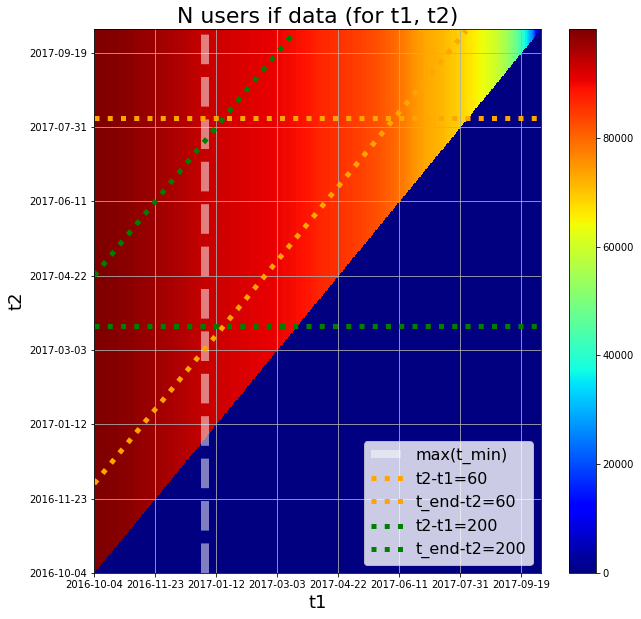

In [59]:
plt.figure(figsize = (10,10))
plt.title("N users if data (for t1, t2)", fontsize = 22)
plt.xlabel("t1", fontsize = 18)
plt.ylabel("t2", fontsize = 18)

t_list = list(sorted(df['chq_date'].drop_duplicates()))
M      = np.zeros((len(t_list), len(t_list)))
for c1, (k1, o1) in enumerate(N_users.items()):
    i1 = t_list.index(k1)
    for c2, (k2, v) in enumerate(o1.items()):
        i2 = t_list.index(k2)        
        M[i2, i1] = v
plt.pcolormesh(M, cmap=plt.cm.jet)
plt.xlabel
plt.colorbar()
plt.grid()
plt.xticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)
plt.yticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)

t_index_start = t_list.index(t_data_start)
plt.plot([t_index_start, t_index_start],
         [0, len(t_list)],
         '--', 
         label = 'max(t_min)', 
         linewidth = 8,
         alpha = 0.5,
         color = 'white')

for  clr, deltat1t2 in [['orange', 60], 
                        ['green', 200]]:
    t1_list = list(range(0, len(t_list)-deltat1t2))
    t2_list = [t+deltat1t2 for t in t1_list]
    plt.plot(t1_list, t2_list, 
             label = f't2-t1={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    
    plt.plot([0, len(t_list)],
            [len(t_list)-deltat1t2, len(t_list)-deltat1t2],
             label = f't_end-t2={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    


    
plt.legend(fontsize = (16), loc = 'lower right')
plt.show()

> Видно, что количество пользователей в выборке для обучения зависит только от t1

In [60]:
all([len(set(i.values()))==1 for i in N_users.values()])

True

In [61]:
list(list(N_users.items())[0][1].items())[0],\
list(list(N_users.items())[2][1].items())[0]

((numpy.datetime64('2016-10-04T00:00:00.000000000'), 99982),
 (numpy.datetime64('2016-10-06T00:00:00.000000000'), 99944))

> Предполагаем, что в интервале от 0 до max(t_min) падает количество N_users в основном за счет пользователей с одной покупкой (купили карту и сразу ее потеряли)

In [62]:
#Можно заметить, что есть пользователи только с одной транзакцией
df_client.loc['8f86d689f835936fb38187f1309719c5'].head()

t_min                              2016-10-04 00:00:00
t_max                              2016-10-04 00:00:00
_t_list                [2016-10-04T00:00:00.000000000]
items_N                                              2
items_sales_sum_sum                             3267.0
Name: 8f86d689f835936fb38187f1309719c5, dtype: object

#### Посмотрим на churn users

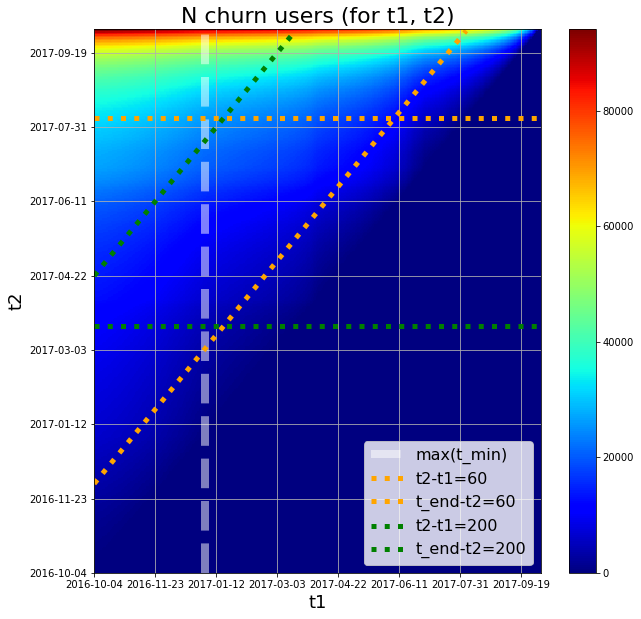

In [63]:
plt.figure(figsize = (10,10))
plt.title("N churn users (for t1, t2)", fontsize = 22)
plt.xlabel("t1", fontsize = 18)
plt.ylabel("t2", fontsize = 18)

t_list = list(sorted(df['chq_date'].drop_duplicates()))
M      = np.zeros((len(t_list), len(t_list)))
for c1, (k1, o1) in enumerate(Churn_users.items()):
    i1 = t_list.index(k1)
    for c2, (k2, v) in enumerate(o1.items()):
        i2 = t_list.index(k2)        
        M[i2, i1] = v
plt.pcolormesh(M, cmap=plt.cm.jet)# cmap=cmap, rasterized=True, vmin=-4, vmax=4)
plt.xlabel
plt.colorbar()
plt.grid()
plt.xticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)
plt.yticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)

t_index_start = t_list.index(t_data_start)
plt.plot([t_index_start, t_index_start],
         [0, len(t_list)],
         '--', 
         label = 'max(t_min)', 
         linewidth = 8,
         alpha = 0.5,
         color = 'white')

for  clr, deltat1t2 in [['orange', 60], 
                        ['green', 200]]:
    t1_list = list(range(0, len(t_list)-deltat1t2))
    t2_list = [t+deltat1t2 for t in t1_list]
    plt.plot(t1_list, t2_list, 
             label = f't2-t1={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    
    plt.plot([0, len(t_list)],
            [len(t_list)-deltat1t2, len(t_list)-deltat1t2],
             label = f't_end-t2={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    


plt.legend(fontsize = (16), loc = 'lower right')
plt.show()

> В абсолютной величине количество пользователей которые считаются churn зависит и от t1, и от t2

<ipython-input-64-90db131d282a>:8: RuntimeWarning: invalid value encountered in long_scalars
  dct = {k1:{k2:v2/N_users[k1][k2] for k2, v2 in o.items()}


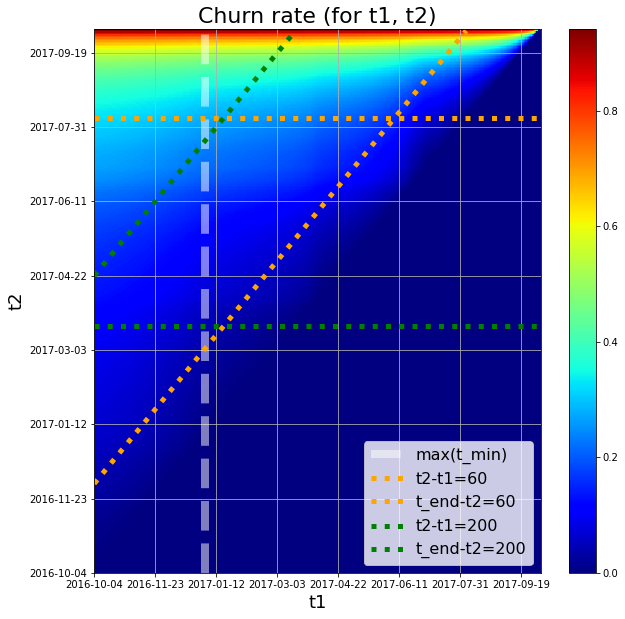

In [64]:
plt.figure(figsize = (10,10))
plt.title("Churn rate (for t1, t2)", fontsize = 22)
plt.xlabel("t1", fontsize = 18)
plt.ylabel("t2", fontsize = 18)

t_list = list(sorted(df['chq_date'].drop_duplicates()))
M      = np.zeros((len(t_list), len(t_list)))
dct = {k1:{k2:v2/N_users[k1][k2] for k2, v2 in o.items()} 
       for k1,o in Churn_users.items()}

for c1, (k1, o1) in enumerate(dct.items()):
    i1 = t_list.index(k1)
    for c2, (k2, v) in enumerate(o1.items()):
        i2 = t_list.index(k2)        
        M[i2, i1] = v
        
plt.pcolormesh(M, cmap=plt.cm.jet)#, rasterized=True, vmin=-4, vmax=4)
plt.xlabel
plt.colorbar()
plt.grid()
plt.xticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)
plt.yticks( range(len(t_list))[::50], [str(i)[:10] for i in t_list[::50]], fontsize = 10)

t_index_start = t_list.index(t_data_start)
plt.plot([t_index_start, t_index_start],
         [0, len(t_list)],
         '--', 
         label = 'max(t_min)', 
         linewidth = 8,
         alpha = 0.5,
         color = 'white')

# Нарисуем график t2-t1 = 60, t2=t1+60
for  clr, deltat1t2 in [['orange', 60], 
                        ['green', 200]]:
    t1_list = list(range(0, len(t_list)-deltat1t2))
    t2_list = [t+deltat1t2 for t in t1_list]
    plt.plot(t1_list, t2_list, 
             label = f't2-t1={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    
    plt.plot([0, len(t_list)],
            [len(t_list)-deltat1t2, len(t_list)-deltat1t2],
             label = f't_end-t2={deltat1t2}', 
             linestyle = ':', 
             linewidth = 5,
             #alpha = 0.6, 
             color = clr)
    

plt.legend(fontsize = (16), loc = 'lower right')
plt.show()

In [65]:
df['chq_date'].max()

Timestamp('2017-10-04 00:00:00')

Итоги:

        - Выбирая t1-t2 большим(например 150 дней, 200 дней не везают), получаем ильный дисбаланс классов и маленький размер выборки с churn
          
          В задаче определения churn нас не столько интересуют уйдет ли пользователь или нет, 
          сколько ранжирующая способность, определяющая вероятность этого
          Так как результаты системы определения churn могут быть использованы
            для оптимизации call центра, уведомлений и других способов взаимодействия с клиентами
          От дисбаланса классов качество модели и дисперсии многих метрик ухудшаются
            
        - умешаем количество FN
            
    - При t2 близком к t1
        - Модель учится на более свежих данных
    
        - Мы увеличиваем долю класса churn
          (Цель определения churn-а -- повысить активность клиентов)
        
        - В разметке уменьшаем ошибки типа FP

Можно  выбирать отсечки автоматически для каждого клиента.
                4 каринки выше: если в среднем пользователь ходит в магазин раз в неделю, раз в год случается, что он не ходит в магазин два месяца.

Взвешивая все за и против, выберем посередине:
    
    - Нормальный баланс churn
    - Чуть большую ошибку в целом (но менее 5%)
    - Уменьшение ошибки FN


Из всего сказанного выше, мы должны получить чуть большую ранжирующую способность алгоритма.
Три месяца -- это адекватный срок для предсказания активности человека (в банке просрочка по кредитам считается 30-90 дней).
    
    t_end          = 2017-10-04 (Конец выборки)
    t2             = 2017-07-06
    t1 = t_start   = 2016-10-04 (Начало выборки)

### Создание модели и валидация

Окно для признаков стоит зафиксировать (если данные будут копиться, некоторые признаки поедут), либо все признаки не должны зависеть от количества данных (нет функций сумм, есть функции mean).
Принципиально здесь можно использовать два типа моделей.

# 3. Создание модели

In [67]:
# Количество дней - 90
DAYS_CHURN = 90

In [68]:
# Мы считаем что churn - эти пользователи, у которых нет транзакций в течение этого времени
t_end = df['chq_date'].max()
print(t_end)
t2 = t_end - timedelta(days = DAYS_CHURN)
print(t2)

2017-10-04 00:00:00
2017-07-06 00:00:00


#### Какая действительная доля churn_rate?

In [69]:
all_users_list       = df['client_id'].unique()
not_churn_users_list = df.loc[df['chq_date']>t2, 'client_id'].unique()
churn_users          = list(set(all_users_list)-set(not_churn_users_list)) 

print('Churn rate is %2.4f'%(len(churn_users)/len(all_users_list)))

Churn rate is 0.2716


In [70]:
df.keys()

Index(['chq_id', 'plant', 'chq_date', 'chq_position', 'client_id', 'material',
       'sales_count', 'sales_sum', 'is_promo', 'material__is_private_label',
       'material__is_alco', 'material__is_food', 'plant__is_SM',
       'plant__is_city_St. Petersburg', 'plant__is_city_Other',
       'plant__is_city_Moscow', 'chq_id_sum_sales_count', 'chq_id_len',
       'chq_id_sum_sales_sum', 'chq_id_material__is_private_label',
       'chq_id_material__is_alco', 'chq_id_material__is_food',
       'chq_date(month)', 'chq_date(week)', 'chq_date[day_of_week]'],
      dtype='object')

In [71]:
%%time

def diff_to_days(x):
    return x / np.timedelta64(1, 's') / 60 / 60 / 24

def _get_features(data, t_start, t_end):
    data_no_duplicates = data.drop_duplicates("chq_id")
    data_negative      = data[data['sales_sum']<0]
    
    t_list = list(sorted(data_no_duplicates['chq_date'].unique()))
    deltas = diff_to_days(np.diff(t_list)) #интервалы между датами транзакций
    bins = [0, 1, 7, 14, 21, 28, 56, 112, 224, 448]
    res = {
           't_min'  : data['chq_date'].min(),          # Даты транзакций (первая, последняя и весь список)
           't_max'  : data['chq_date'].max(),  
           '_t_list' : t_list,
        
           'items_N'               : data['chq_id'].nunique(),              # Общее количество походов в магазин
           'items_sales_sum_sum'   : data['sales_sum'].sum(),     # Сколько потратил
           'items_sales_count_sum' : data['sales_count'].sum(), # Сколько покупок сделал

           'items_N_negative' : data_negative['chq_id'].nunique(),              # Количество пробитых товаров
           'items_sales_sum_sum_negative':data_negative['sales_sum'].sum(),     # Сколько потратил
           'items_sales_count_sum_negative':data_negative['sales_count'].sum(), # Сколько покупок сделал
           
           "item_price_mean" : data['chq_id_sum_sales_count'].mean(), # Средняя цена товара
           "item_price_max"  : data['chq_id_len'].max(),              # Максимальная цена товара
           "item_price_min"  : data['chq_id_sum_sales_sum'].min(),    # Минимальная цена товара
           
        
           'chq_id_sum_sales_count_mean':data_no_duplicates['chq_id_sum_sales_count'].mean(),   # Средний количество покупок
           'chq_id_len_mean':data_no_duplicates['chq_id_len'].mean(),                           # Средее количнтво товаров
           'chq_id_sum_sales_sum_mean':data_no_duplicates['chq_id_sum_sales_sum'].mean(),       # Средняя цена товаров
                   
           'chq_id_sum_sales_count_min':data_no_duplicates['chq_id_sum_sales_count'].min(),  # То же самое для минимума
           'chq_id_len_min':data_no_duplicates['chq_id_len'].min(),
           'chq_id_sum_sales_sum_min':data_no_duplicates['chq_id_sum_sales_sum'].min(),
            
           
           'chq_id_sum_sales_count_max':data_no_duplicates['chq_id_sum_sales_count'].max(), # То же самое для максимума
           'chq_id_len_max':data_no_duplicates['chq_id_len'].max(),
           'chq_id_sum_sales_sum_max':data_no_duplicates['chq_id_sum_sales_sum'].max(),
        
           'promo_rate_count': (data['is_promo']==1).mean(),    # Доля промо
           'promo_rate_sales_sum': (data.loc[(data['is_promo']==1), 'sales_sum'].sum()+1)/(data['sales_sum'].sum()+1),
           'promo_rate_sales_count': (data.loc[(data['is_promo']==1), 'sales_count'].sum()+1)/(data['sales_count'].sum()+1),
        
            "delta_median" : np.median(deltas) if len(deltas)>0 else np.nan, # 
            "delta_min"    : np.min(deltas) if len(deltas)>0 else np.nan,
            "delta_max"    : np.max(deltas) if len(deltas)>0 else np.nan,
            "delta_std"    : np.std(deltas) if len(deltas)>0 else np.nan,
            "delta_moda"   : np.argmax(np.bincount(deltas.astype(int))) if len(deltas)>0 else np.nan,
          }
    
    # Признаки сколько активности пользователя по дням
    res['days_from_start'] = (res['t_min']-t_start).days
    res['days_until_end']  = (t_end-res['t_max']).days
    res['days_max']        = (res['t_max']-res['t_min']).days
    
    # Последний поход в магазин
    res['deltas_-1'] = deltas[-1] if len(deltas)>0 else np.nan
    res['deltas_-2'] = deltas[-2] if len(deltas)>1 else np.nan
    res['deltas_-1_frac_-2'] = deltas[-2]/deltas[-1]if len(deltas)>1 else np.nan
    
    # Признаки про магазин
    for key in ['plant__is_SM', 'plant__is_city_St. Petersburg', 'plant__is_city_Other', 'plant__is_city_Moscow']:
        res[key+"_mean"] = data_no_duplicates[key].mean()
                
    # Признаки про товар
    for key in ['chq_id_material__is_private_label', 'chq_id_material__is_alco', 'chq_id_material__is_food']:
        res[key+"_mean"] = data_no_duplicates[key].mean()
                
    # Средняя цена покупки
    res['chq_id__average_transaction'] = res['chq_id_sum_sales_sum_mean'] / res['chq_id_sum_sales_count_mean']

    # Позитивные транзакции
    res['items_N_positive']               = res['items_N']-res['items_N_negative']
    res['items_sales_sum_sum_positive']   = res['items_sales_sum_sum']-res['items_sales_sum_sum_negative']
    res['items_sales_count_sum_positive'] = res['items_sales_count_sum']-res['items_sales_count_sum_negative']
    
    
    # Отношение негативного к позитивному
    ##res['negative_pos_rate_len_positive'] = res['negative_pos_rate_len']  -res['negative_pos_rate_len_negative']  
    for l in range(1, len(bins)):
        res[f'delta_bin_{bins[l-1]}_{bins[l],}'] = np.mean([((bins[l-1]<=x) and (x<bins[l]))  for x in deltas])
    
    
    for c in range(2):
        res[f'plant_key_{c}'] = np.nan
        res[f'plant_val_{c}'] = np.nan 
        res[f'material_key_{c}'] = np.nan
        res[f'material_val_{c}'] = np.nan 
        
    res['plant_N']    = data['plant'].nunique()
    res['material_N'] = data_no_duplicates['material'].nunique()
    
    # Самые популярные города по количеству и из доля
    for c, (key, val) in enumerate(data_no_duplicates['plant'].value_counts(True).to_dict().items()):
        if c>=2:
            break

        res[f'plant_key_{c}'] = key
        res[f'plant_val_{c}'] = val     
    #два топовых магазина для юзера
        
    # Самые популярные товары по количеству и из доля    
    for c, (key, val) in enumerate(data['material'].value_counts(True).to_dict().items()):
        if c>=2:
            break
            
        res[f'material_key_{c}'] = key
        res[f'material_val_{c}'] = val  
    
    # Добавить join на metrials из таблицы 'materials.txt'
    # Добавить join на plant из таблицы пользователей если для каждого магазина взять максимальное количество пользователей с городом, это должно помоч

    return pd.Series(res)  

# _get_features(df[:100])

# test on 1 user
# user_sample = ["1a47d62dddacc03fe90c15652f7ae1a4"]#df['client_id'].sample(5000, random_state = 42).to_numpy()
# res = df[df['client_id'].isin(user_sample)].groupby('client_id').apply(lambda x:_get_features(x, 
#                                                                                              pd.to_datetime('2019.01.01'),
#                                                                                              pd.to_datetime('2019.01.01')))

# test on 5000 users
# user_sample = df['client_id'].sample(500, random_state = 42).to_numpy()
# res = df[df['client_id'].isin(user_sample)].groupby('client_id').apply(lambda x:_get_features(x, 
#                                                                                              pd.to_datetime('2019.01.01'),
#                                                                                              pd.to_datetime('2019.01.01')))
# _get_features(df[df['client_id'].isin(user_sample)], 
#               pd.to_datetime('2019.01.01'),
#               pd.to_datetime('2019.01.01')
#              )
# res = df[df['client_id'].isin(user_sample)].groupby('client_id').apply(lambda x:_get_features(x, 
#                                                                                              pd.to_datetime('2019.01.01'),
#                                                                                              pd.to_datetime('2019.01.01')))
# 

# res
# df_client = df.groupby('client_id').apply(_get_features)
# df_client['client_id'] = df_client.index
# print('Finish calculating')

# df_client.to_parquet("results/df_client_id.parquet")
# df_client

CPU times: user 0 ns, sys: 36 µs, total: 36 µs
Wall time: 45.3 µs


In [74]:
def to_data(df):
    t_start = df['chq_date'].min()
    t_end   = df['chq_date'].max()

    df_client = df.groupby('client_id').apply(lambda o:_get_features(o, t_start, t_end))
    
    df_client_raw = pd.read_csv('clients.csv')
    df_client = df_client.join(df_client_raw.set_index("client_id"))
    
    def foo(x):
        if not isinstance(x, str):
            return 0
        elif x == 'M':
            return 1
        elif x == 'F':
            return -1
        else :
            raise ValueError('Strange type for "gender"')
            
    df_client['is_male'] = df_client['gender'].apply(lambda x: foo(x))
    
    df_client['age'] = 2017 - df_client['birthyear']
    
    # Добавим признак странный год
    df_client['age_correct'] = ((df_client['age']<0) | (df_client['age']>80)).astype(int)

    df_client['is_na(all)'] = df_client.isna().sum(axis = 1)
    
    features = ["items_N", "items_N_negative", "item_price_max", "chq_id_len_min",
            "chq_id_len_max", "items_N_positive", "items_sales_sum_sum", "items_sales_count_sum", 
            "items_sales_sum_sum_negative", "items_sales_count_sum_negative", 
            "item_price_mean", "item_price_min", "chq_id_sum_sales_count_mean",
            "chq_id_len_mean", "chq_id_sum_sales_sum_mean", "chq_id_sum_sales_count_min",
            "chq_id_sum_sales_sum_min", "chq_id_sum_sales_count_max", "chq_id_sum_sales_sum_max", 
            "promo_rate_count", "promo_rate_sales_sum", "promo_rate_sales_count", "delta_median", 
            "delta_min", "delta_max", "delta_std", "delta_moda", "items_sales_sum_sum_positive", 
            "items_sales_count_sum_positive", "delta_bin_0_(1,)", "delta_bin_1_(7,)", "delta_bin_7_(14,)",
            "delta_bin_14_(21,)", "delta_bin_21_(28,)", "delta_bin_28_(56,)", "delta_bin_56_(112,)",
            "delta_bin_112_(224,)", "delta_bin_224_(448,)", "plant_val_0", "material_val_0", "plant_val_1", 
            "material_val_1", "birthyear", "is_male", "age", "age_correct", "is_na(all)"]

    df_client['is_na(features)'] = df_client[features].isna().sum(axis = 1)

    return df_client

In [75]:
%%time
data = to_data(df[df['chq_date']<t2])#.groupby('client_id').apply(_get_features)

/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-p

CPU times: user 22min 49s, sys: 11.4 s, total: 23min
Wall time: 22min 58s


In [76]:
data.to_parquet('results/data_3month_features.parquet')

In [104]:
## ДОбавим еще несколько переменных, о которых мы забыли
data['items_N_positive_frac'] = data['items_N_positive'] / data['items_N']
data['items_frac_sales_sum_sum_negative'] = data['items_sales_sum_sum_negative'] / data['items_sales_sum_sum']
data['items_frac_sales_count_sum_negative'] = data['items_sales_count_sum_negative'] / data['items_sales_count_sum']
data['days_items_frequency'] = (data['days_max'])/(data['items_N'])

In [78]:
data['client_id'] = data.index.tolist()
data['y'] = data['client_id'].isin(churn_users).astype(int)

### Визуализация признаков

In [155]:
data.dtypes.astype(str).unique()

array(['datetime64[ns]', 'object', 'int64', 'float64'], dtype=object)

In [156]:
_normal_dtypes = ['int64', 'float64', 'bool']
features_with_normal_types = data.dtypes.astype(str)
features_with_normal_types = features_with_normal_types[features_with_normal_types.isin(_normal_dtypes)].index
features_with_normal_types = list(sorted(features_with_normal_types))

features_with_normal_types.remove('y')

In [157]:
print(Counter([i.split('_')[0] for i in features_with_normal_types]))

Counter({'chq': 13, 'delta': 13, 'items': 12, 'plant': 7, 'days': 4, 'deltas': 3, 'is': 3, 'item': 3, 'material': 3, 'promo': 3, 'age': 2, 'birthyear': 1})


In [158]:
print(len(features_with_normal_types))

67


['age', 'age_correct']


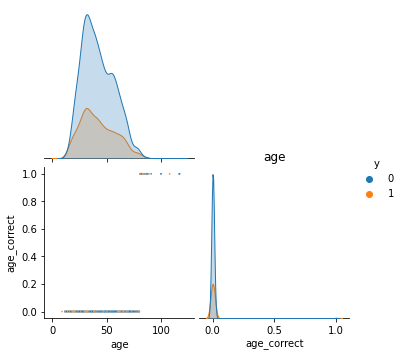

['items_N', 'items_N_negative', 'items_N_positive', 'items_N_positive_frac', 'items_frac_sales_count_sum_negative', 'items_frac_sales_sum_sum_negative', 'items_sales_count_sum', 'items_sales_count_sum_negative', 'items_sales_count_sum_positive', 'items_sales_sum_sum', 'items_sales_sum_sum_negative', 'items_sales_sum_sum_positive']


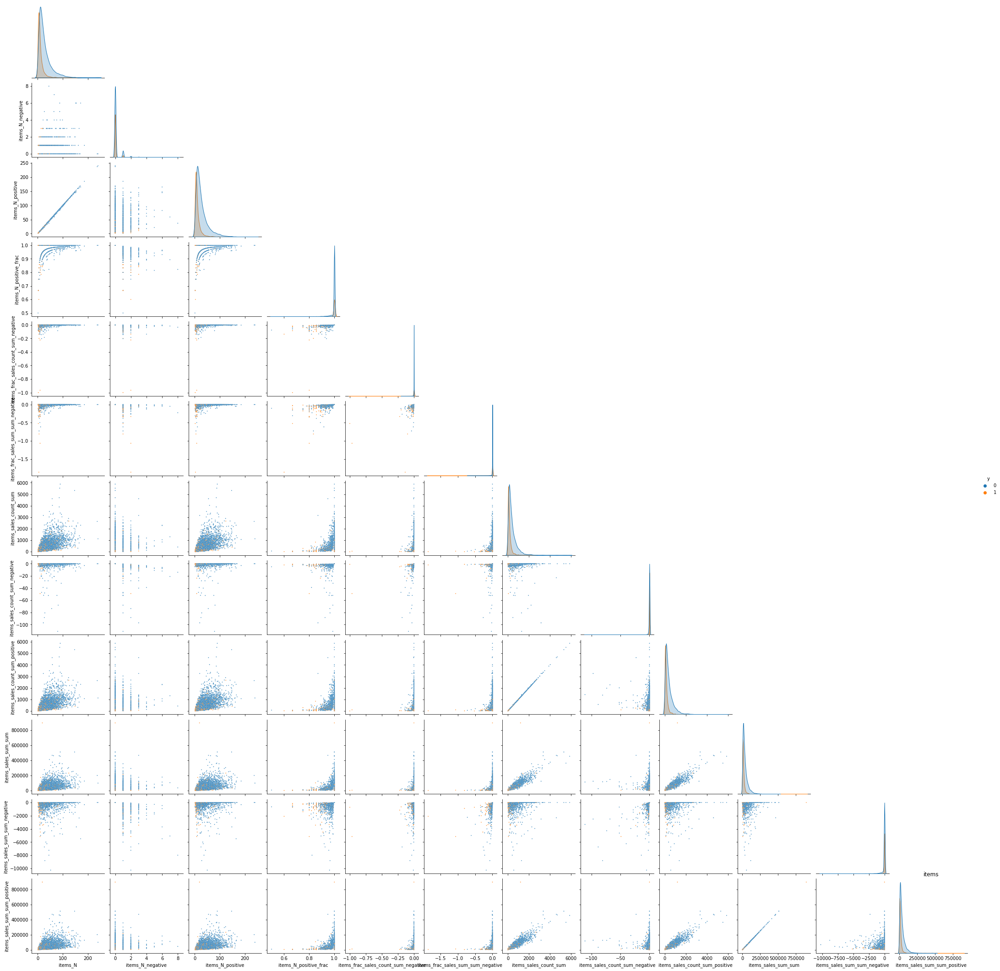

['plant_N', 'plant__is_SM_mean', 'plant__is_city_Moscow_mean', 'plant__is_city_Other_mean', 'plant__is_city_St. Petersburg_mean', 'plant_val_0', 'plant_val_1']


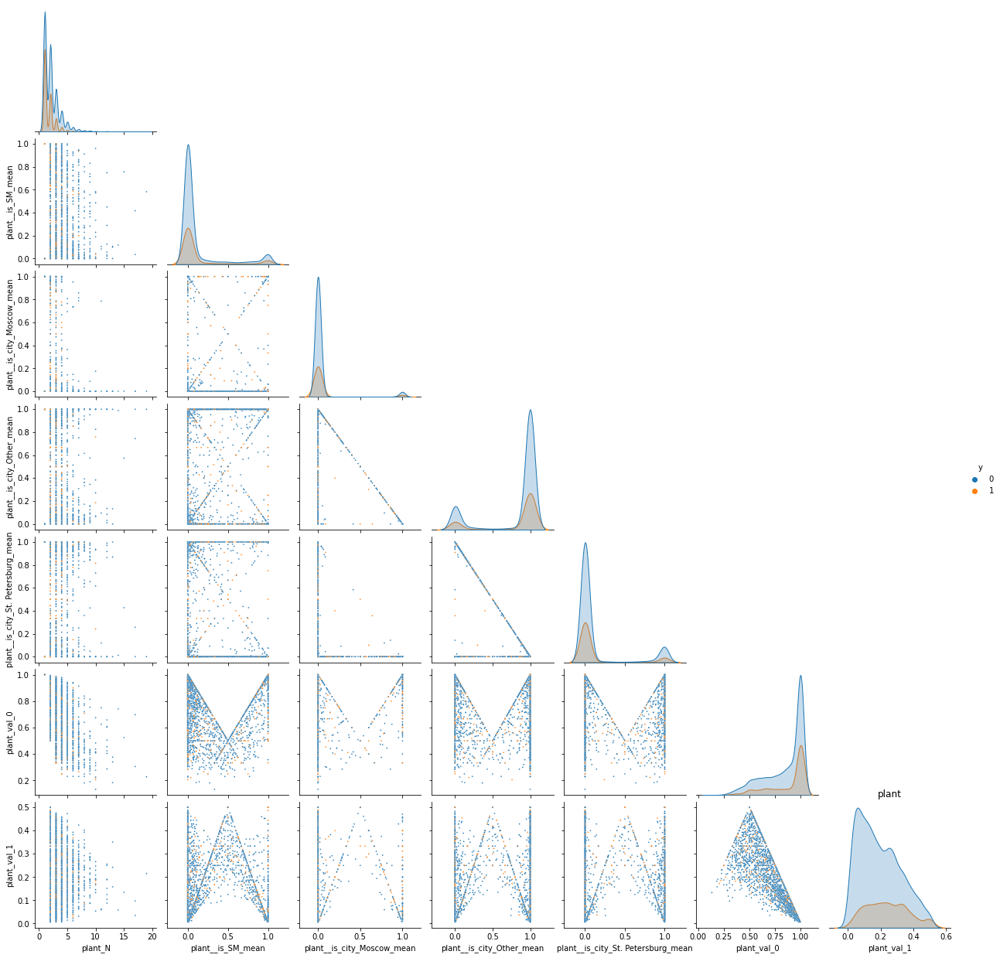

['chq_id__average_transaction', 'chq_id_len_max', 'chq_id_len_mean', 'chq_id_len_min', 'chq_id_material__is_alco_mean', 'chq_id_material__is_food_mean', 'chq_id_material__is_private_label_mean', 'chq_id_sum_sales_count_max', 'chq_id_sum_sales_count_mean', 'chq_id_sum_sales_count_min', 'chq_id_sum_sales_sum_max', 'chq_id_sum_sales_sum_mean', 'chq_id_sum_sales_sum_min']


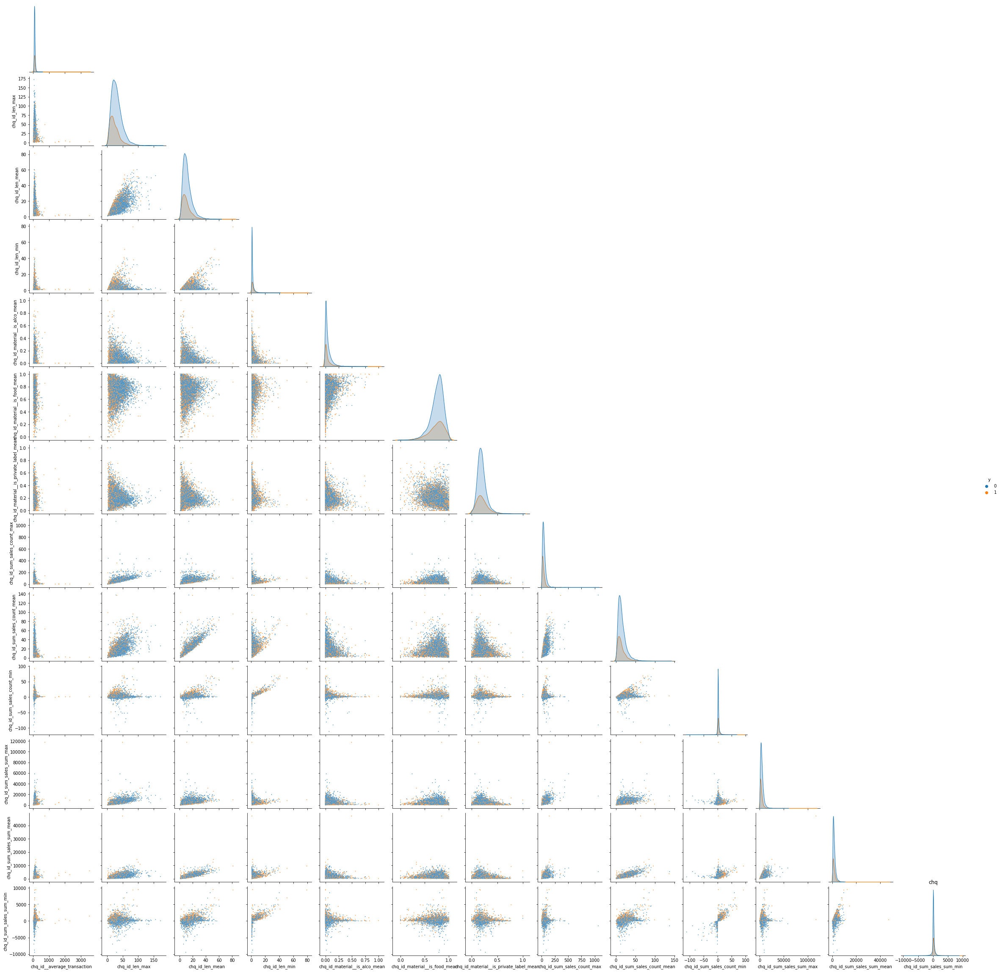

['days_from_start', 'days_max', 'days_until_end']


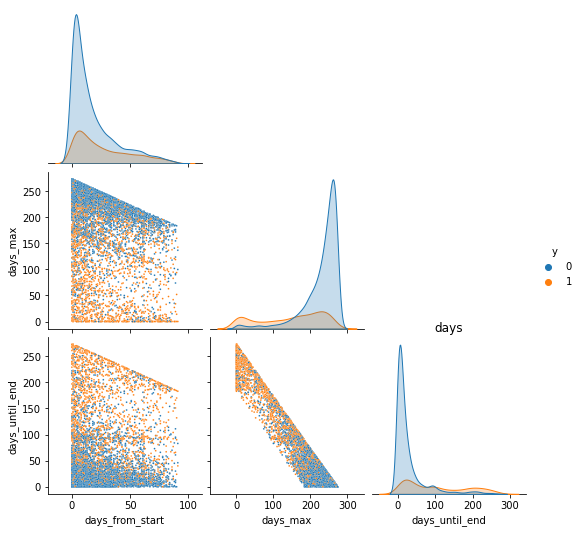

['is_male', 'is_na(all)', 'is_na(features)']


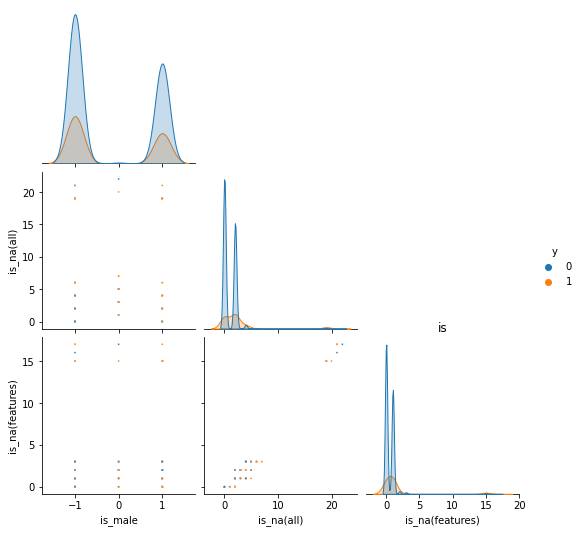

['material_N', 'material_val_0', 'material_val_1']


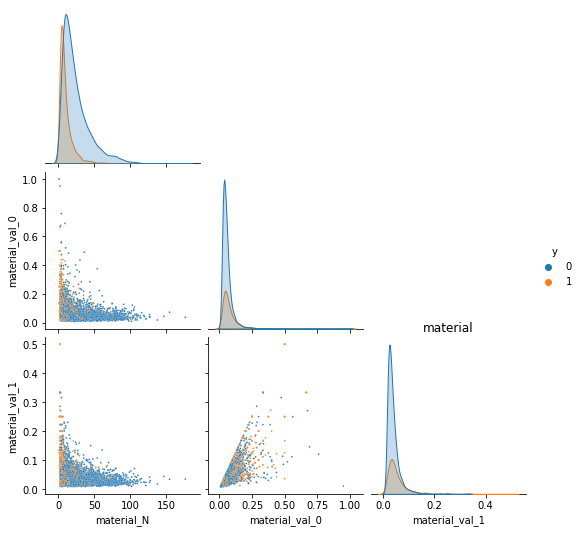

['delta_bin_0_(1,)', 'delta_bin_112_(224,)', 'delta_bin_14_(21,)', 'delta_bin_1_(7,)', 'delta_bin_21_(28,)', 'delta_bin_224_(448,)', 'delta_bin_28_(56,)', 'delta_bin_56_(112,)', 'delta_bin_7_(14,)', 'delta_max', 'delta_median', 'delta_min', 'delta_moda', 'delta_std', 'deltas_-1', 'deltas_-1_frac_-2', 'deltas_-2']


/opt/conda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


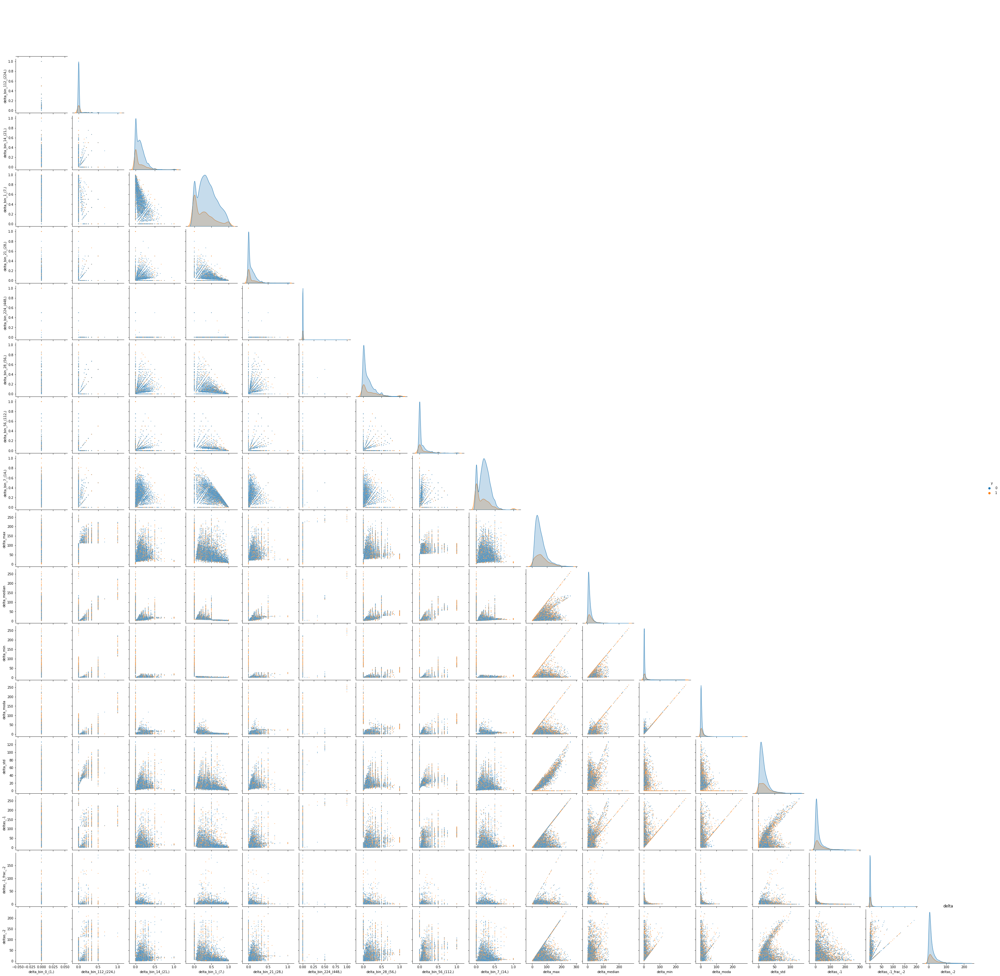

['promo_rate_count', 'promo_rate_sales_count', 'promo_rate_sales_sum']


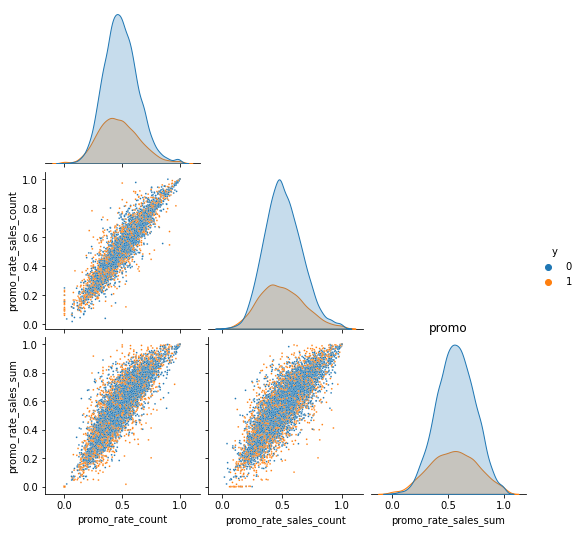

['birthyear']


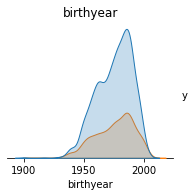

['deltas_-1', 'deltas_-1_frac_-2', 'deltas_-2']


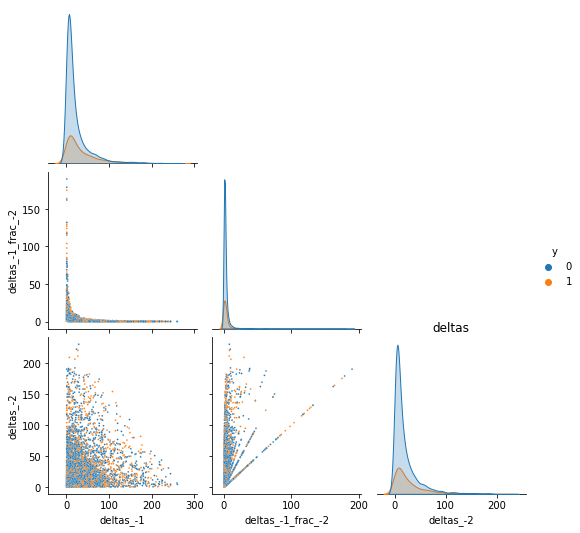

['item_price_max', 'item_price_mean', 'item_price_min', 'items_N', 'items_N_negative', 'items_N_positive', 'items_N_positive_frac', 'items_frac_sales_count_sum_negative', 'items_frac_sales_sum_sum_negative', 'items_sales_count_sum', 'items_sales_count_sum_negative', 'items_sales_count_sum_positive', 'items_sales_sum_sum', 'items_sales_sum_sum_negative', 'items_sales_sum_sum_positive']


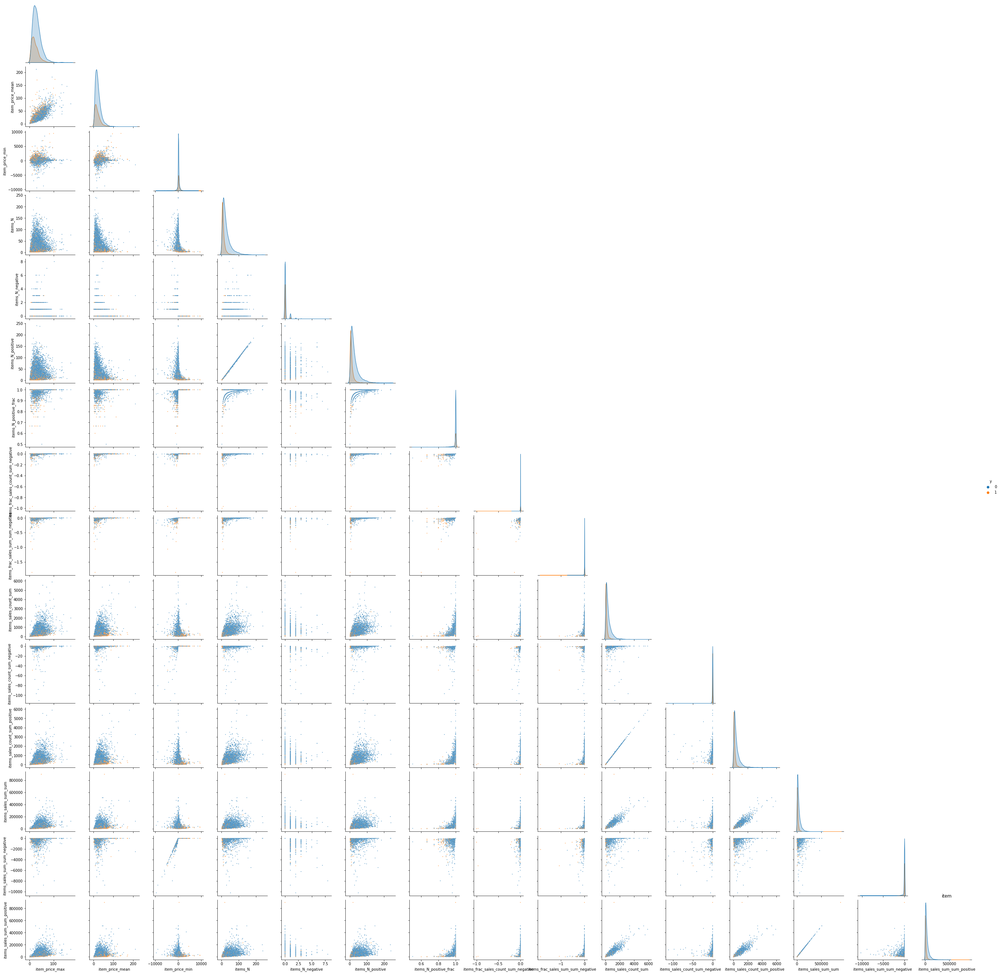

CPU times: user 8min 55s, sys: 9.21 s, total: 9min 4s
Wall time: 8min 31s


In [93]:
%%time
for pref in set([i.split('_')[0] for i in features_with_normal_types]):
    features_draw = [i for i in features_with_normal_types if i.startswith(pref)]
    print(features_draw)
    # features_draw = ["items_N", "items_sales_sum_sum", "items_sales_count_sum"]
    sns.pairplot(data[:10000][features_draw+['y']], 
                 corner=True, 
                 diag_kind="kde",
                 hue='y', plot_kws={"s": 3})
    plt.title(pref)
    plt.savefig(f'results/pairplot_{pref}.png')
    plt.show()

> Яснее не стало

In [162]:
data[features_with_normal_types].fillna(data[features_with_normal_types].mean()).corr().isna().sum().sort_values()

age                     0
deltas_-2               0
is_male                 0
is_na(all)              0
is_na(features)         0
                       ..
delta_max               0
delta_median            0
delta_min               0
days_from_start         0
promo_rate_sales_sum    0
Length: 67, dtype: int64

#### Матрика корреляций признаков (понадобится позже)

In [206]:
# for key in ["delta_bin_0_(1,)"]:
#     del data[key]
#     features_with_normal_types.remove(key)

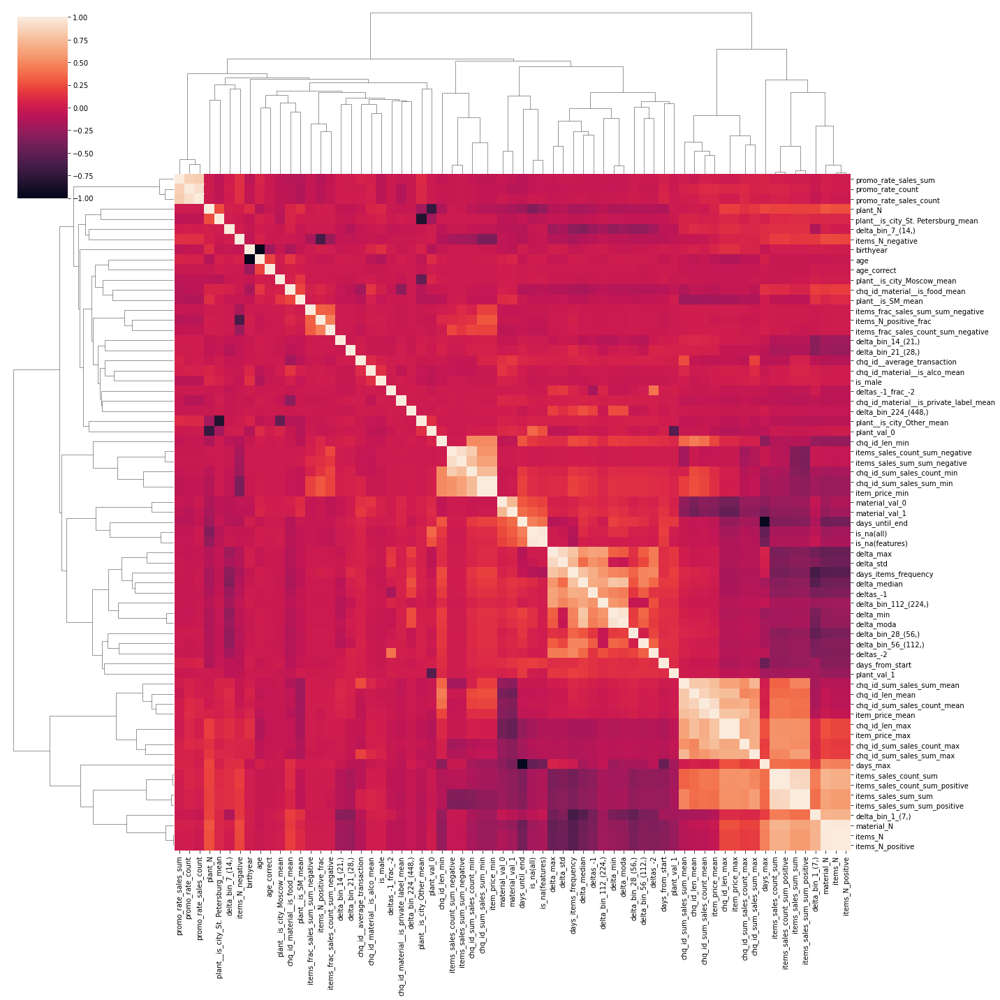

In [164]:
sns.clustermap(data[features_with_normal_types].fillna(data[features_with_normal_types].mean()).corr(), figsize = (20, 20))
plt.savefig('results/corr_matrix.png')
plt.show()

> Будем смотреть на эту табличку во время feature selection

In [209]:
features = features_with_normal_types

#### Создадим обучающую и тестовую выборки

In [167]:
# stratify list creation
o = set(churn_users)
stratify_y = [int(i in o) for i in tqdm.tqdm(all_users_list)]

100%|██████████| 100000/100000 [00:00<00:00, 1095427.43it/s]


In [210]:
# data['client_id'] = data.index.tolist()
# data['y'] = data['client_id'].isin(churn_users).astype(int)

train_users, test_users, _, _ = train_test_split(all_users_list, 
                                                 all_users_list,
                                                 stratify=stratify_y,
                                                 test_size = 0.3,
                                                 random_state = 42)

df_train = data.loc[train_users, features]
df_test  = data.loc[test_users,  features]

y_train = data.loc[train_users, 'y']
y_test  = data.loc[test_users,  'y']

df_train = df_train.replace([np.inf, -np.inf], np.nan)
df_test  = df_test.replace([np.inf, -np.inf], np.nan)

X_train = df_train.fillna(df_train.mean())
X_test  = df_test.fillna(df_test.mean())

# X_train = df_train.fillna(df_train.mean())

In [169]:
print("y_train.mean()", y_train.mean())
print("y_test.mean()", y_test.mean())

y_train.mean() 0.2715714285714286
y_test.mean() 0.2715666666666667


In [170]:
def validate(p_test, p_train, y_test, y_train, feature_importance):
    print('train')
    print('roc_auc %2.3f'%roc_auc_score(y_train, p_train))
    print(classification_report(y_train, p_train>0.5))

    print('test')
    print('roc_auc %2.3f'%roc_auc_score(y_test, p_test))
    print(classification_report(y_test, p_test>0.5))



    plt.figure(figsize = (20, 10))
    plt.title('precision-recall')
    precision, recall, thresholds = precision_recall_curve(y_test, p_test)
    plt.step(recall, precision, label = 'test', where='post')

    precision, recall, thresholds = precision_recall_curve(y_train, p_train)
    plt.step(recall, precision, label = 'train', where='post')

    plt.legend()
    plt.xlabel('Recall', fontsize = 16)
    plt.ylabel('Precision', fontsize = 16)
    plt.grid()
    plt.legend(fontsize = 22)
    plt.show()

    plt.figure(figsize = (20, 10))
    n = len(feature_importance)
    plt.title("Feature importances")
    plt.barh(range(n), 
             list(feature_importance.values()),
             color="r",
             align="center")
    # If you want to define your own labels,
    # change indices to a list of labels on the following line.
    plt.yticks(range(n), list(feature_importance.keys()))
    plt.ylim([-1, n])
    plt.grid()
    plt.show()

##### global

In [171]:
global_res = {}

#### logistic regression (l2)

train
roc_auc 0.836
              precision    recall  f1-score   support

           0       0.82      0.91      0.87     50990
           1       0.67      0.48      0.56     19010

    accuracy                           0.79     70000
   macro avg       0.75      0.69      0.71     70000
weighted avg       0.78      0.79      0.78     70000

test
roc_auc 0.837
              precision    recall  f1-score   support

           0       0.82      0.91      0.87     21853
           1       0.67      0.48      0.56      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.69      0.71     30000
weighted avg       0.78      0.79      0.78     30000



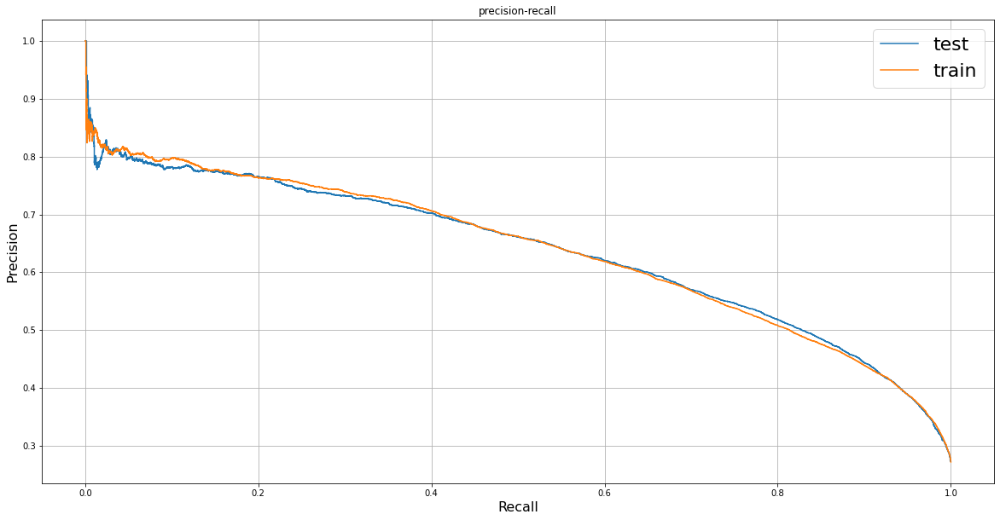

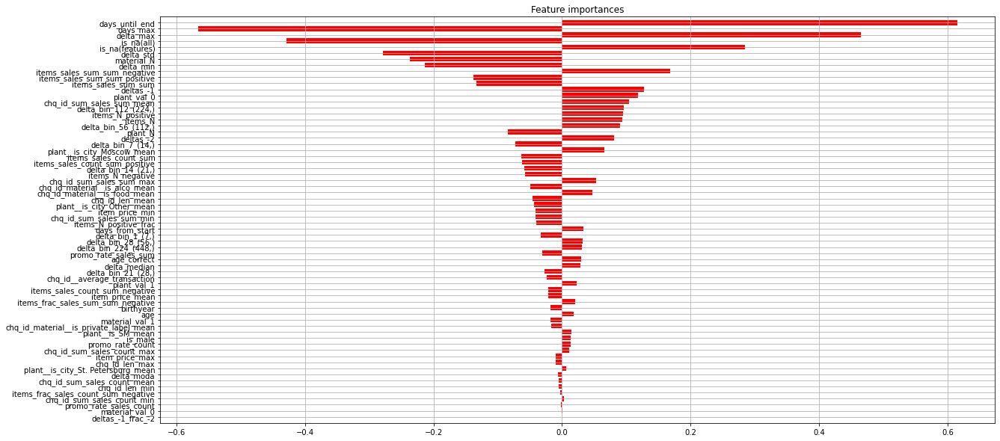

In [172]:
name = 'LR(l2)'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l2'))

model.fit(X_train.to_numpy(), y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]

feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

##### logistic regression (l1)

train
roc_auc 0.836
              precision    recall  f1-score   support

           0       0.82      0.91      0.87     50990
           1       0.67      0.47      0.55     19010

    accuracy                           0.79     70000
   macro avg       0.75      0.69      0.71     70000
weighted avg       0.78      0.79      0.78     70000

test
roc_auc 0.838
              precision    recall  f1-score   support

           0       0.82      0.91      0.87     21853
           1       0.67      0.47      0.55      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.69      0.71     30000
weighted avg       0.78      0.79      0.78     30000



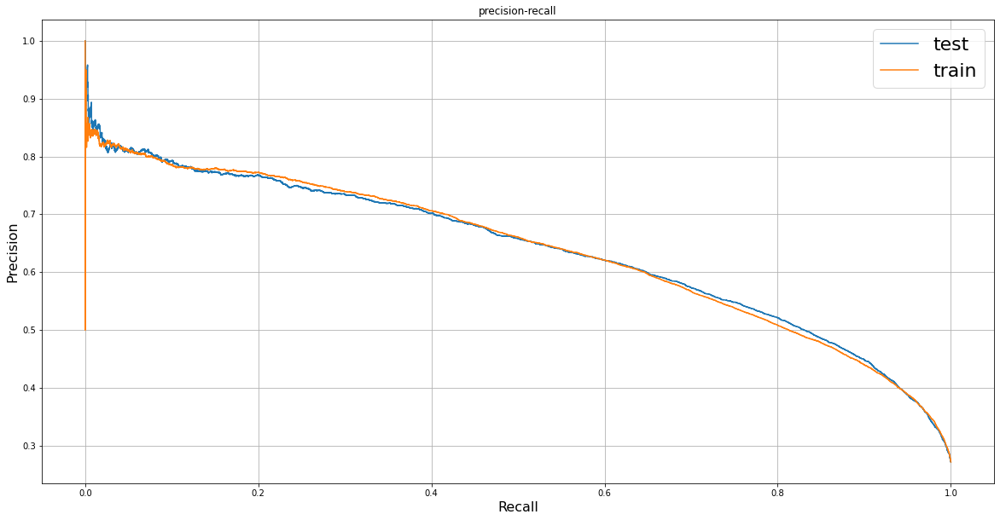

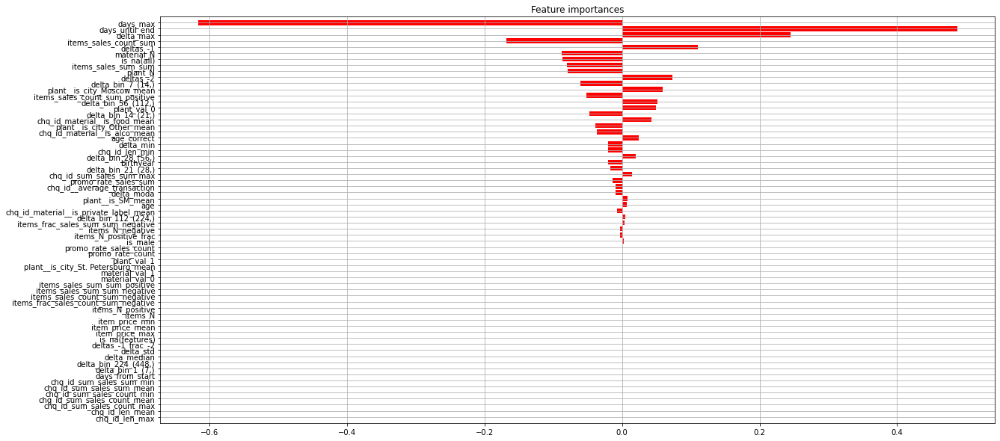

In [173]:
name = 'LR(l1, C=0.01)'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l1',
                                         C = 0.01,
                                         solver = 'liblinear'))

model.fit(X_train.to_numpy(), y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]


feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

#### Logistic regression l1 (balanced)

train
roc_auc 0.836
              precision    recall  f1-score   support

           0       0.88      0.79      0.83     50990
           1       0.56      0.72      0.63     19010

    accuracy                           0.77     70000
   macro avg       0.72      0.75      0.73     70000
weighted avg       0.79      0.77      0.78     70000

test
roc_auc 0.838
              precision    recall  f1-score   support

           0       0.88      0.79      0.83     21853
           1       0.56      0.72      0.63      8147

    accuracy                           0.77     30000
   macro avg       0.72      0.76      0.73     30000
weighted avg       0.80      0.77      0.78     30000



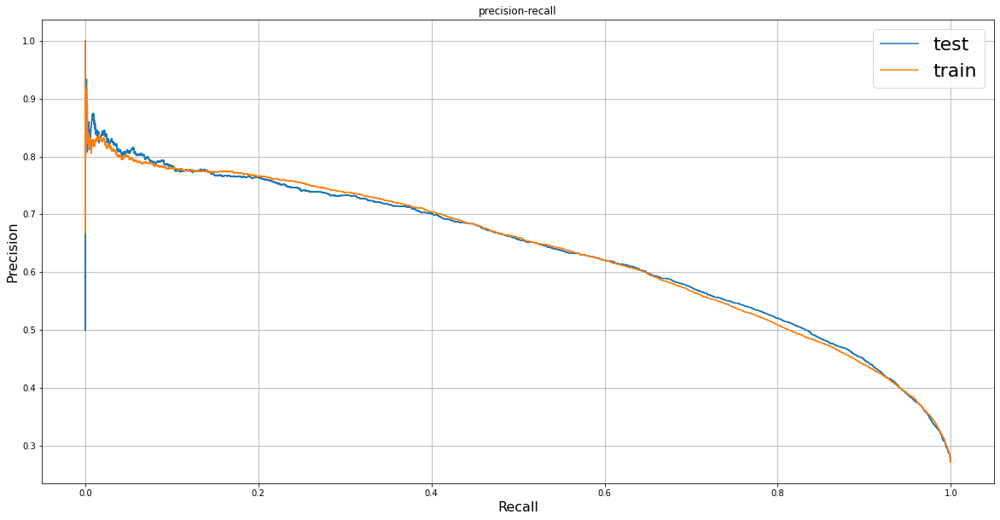

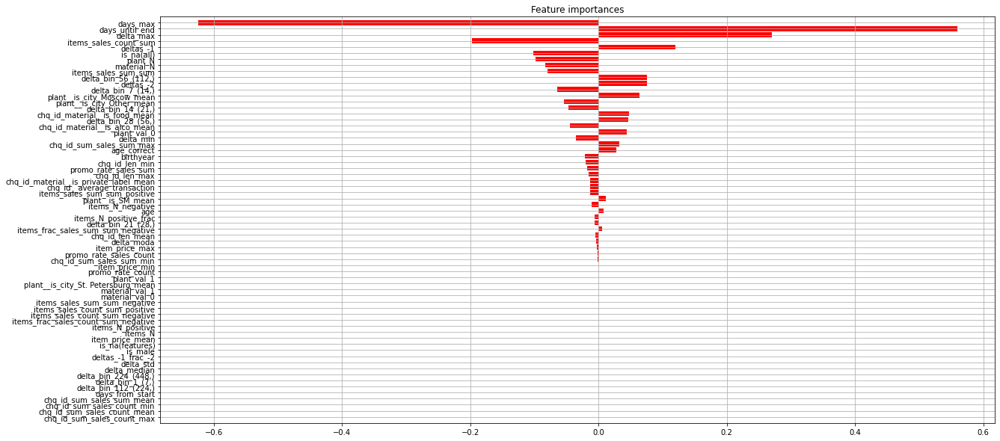

In [174]:
name = 'LR(l1, C=0.01, class_weight=balanced)'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l1',
                                         C = 0.01,
                                         class_weight = 'balanced',
                                         solver = 'liblinear'))

model.fit(X_train.to_numpy(), y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]


feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

##### Desicion tree classifier

train
roc_auc 0.824
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     50990
           1       0.69      0.45      0.55     19010

    accuracy                           0.80     70000
   macro avg       0.75      0.69      0.71     70000
weighted avg       0.78      0.80      0.78     70000

test
roc_auc 0.824
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     21853
           1       0.68      0.45      0.54      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.68      0.70     30000
weighted avg       0.78      0.79      0.78     30000



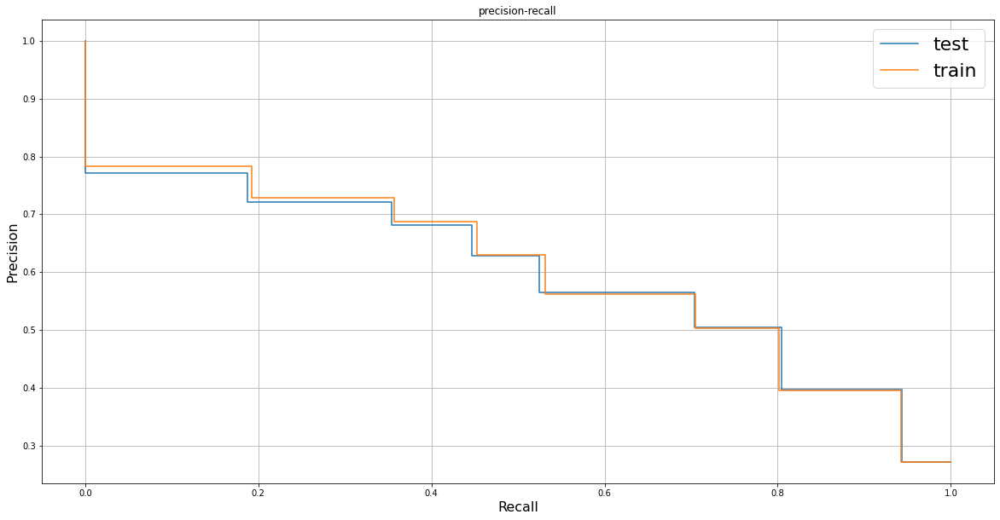

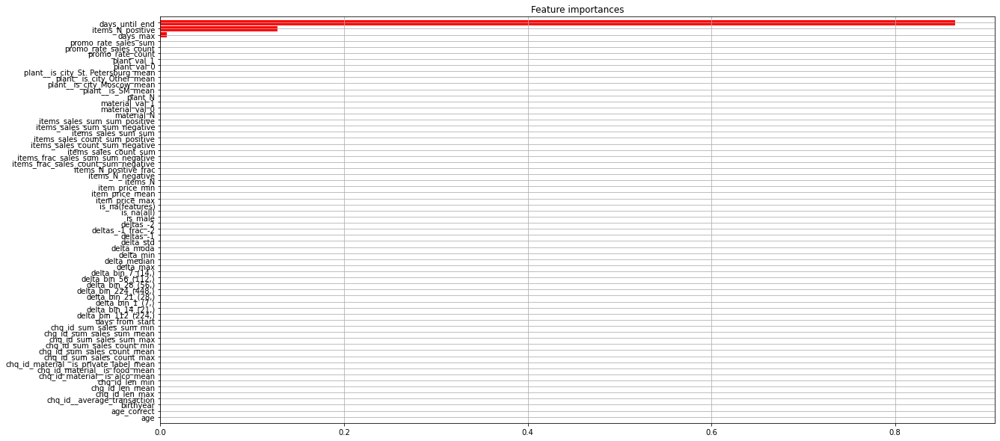

In [175]:
name = 'DecisionTree'
model = DecisionTreeClassifier(max_depth=3)

model.fit(X_train.to_numpy(), y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]

feature_importance = {k:v for k,v in sorted(zip(features, model.feature_importances_), key = lambda x:abs(x[1]))}

global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

# Визуализируем дерево

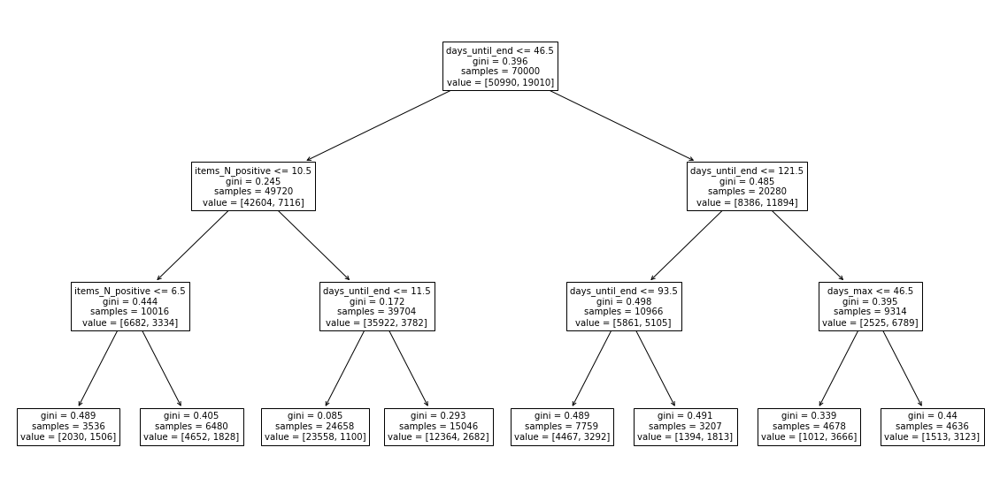

In [176]:
import graphviz 
from sklearn import tree
# dot_data = tree.export_graphviz(model, out_file='tree_depth3.dot', feature_names=features) 
plt.figure(figsize = (20, 10))
tree.plot_tree(model, feature_names = features)
plt.show()


#### Random Forest

train
roc_auc 0.838
              precision    recall  f1-score   support

           0       0.82      0.93      0.87     50990
           1       0.70      0.44      0.54     19010

    accuracy                           0.80     70000
   macro avg       0.76      0.68      0.70     70000
weighted avg       0.78      0.80      0.78     70000

test
roc_auc 0.837
              precision    recall  f1-score   support

           0       0.81      0.93      0.87     21853
           1       0.69      0.43      0.53      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.68      0.70     30000
weighted avg       0.78      0.79      0.78     30000



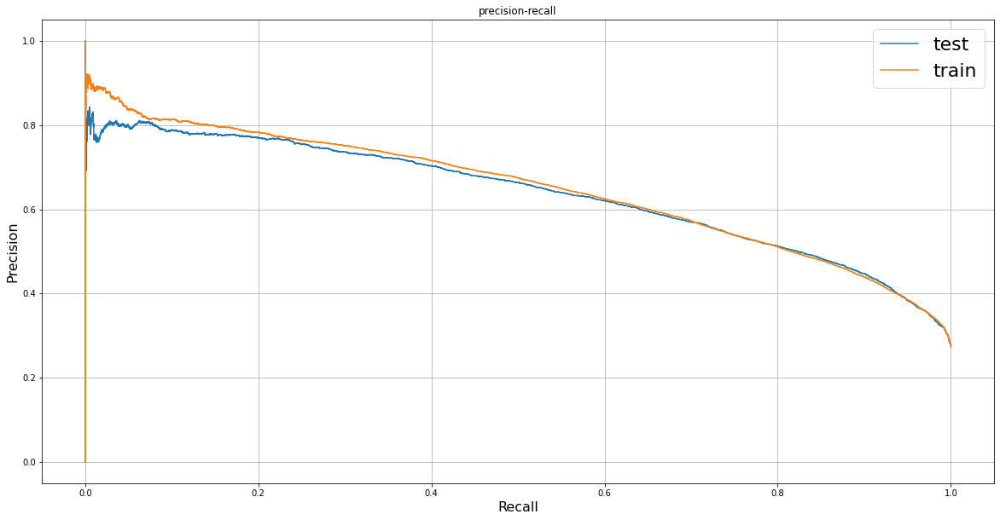

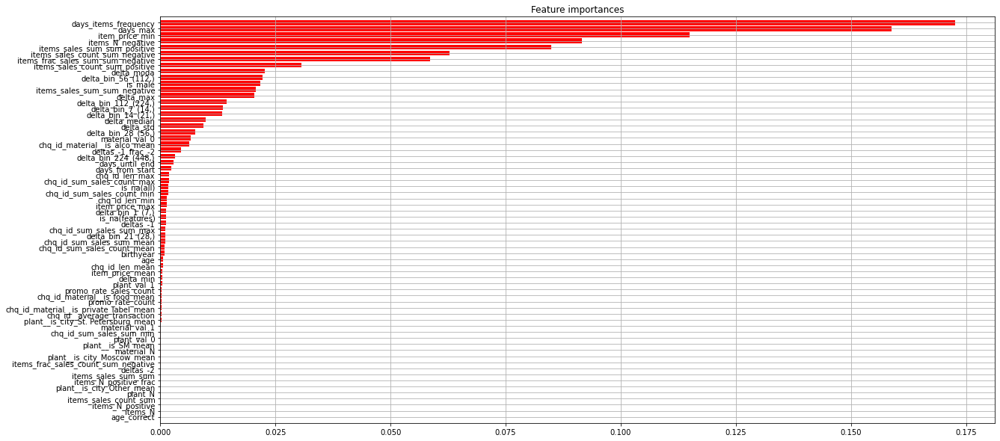

In [201]:
name = 'RF'
model = RandomForestClassifier(n_estimators=100, 
                               max_depth=5, 
                               n_jobs = 10)

model.fit(X_train.to_numpy(), y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]

feature_importance = {k:v for k,v in sorted(zip(features, model.feature_importances_), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                    'p_train':p_train,
                    'y_test':y_test,
                    'y_train':y_train,
                    'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

In [202]:
# feature_importance

##### Catboost classifier

Learning rate set to 0.5
0:	learn: 0.4987824	total: 72.6ms	remaining: 3.56s
1:	learn: 0.4483288	total: 154ms	remaining: 3.71s
2:	learn: 0.4354212	total: 243ms	remaining: 3.81s
3:	learn: 0.4288204	total: 332ms	remaining: 3.82s
4:	learn: 0.4245458	total: 413ms	remaining: 3.72s
5:	learn: 0.4230074	total: 502ms	remaining: 3.68s
6:	learn: 0.4208822	total: 581ms	remaining: 3.57s
7:	learn: 0.4193169	total: 719ms	remaining: 3.77s
8:	learn: 0.4186420	total: 788ms	remaining: 3.59s
9:	learn: 0.4178393	total: 850ms	remaining: 3.4s
10:	learn: 0.4173780	total: 919ms	remaining: 3.26s
11:	learn: 0.4163495	total: 990ms	remaining: 3.14s
12:	learn: 0.4155035	total: 1.07s	remaining: 3.05s
13:	learn: 0.4146808	total: 1.15s	remaining: 2.94s
14:	learn: 0.4142798	total: 1.22s	remaining: 2.86s
15:	learn: 0.4134053	total: 1.3s	remaining: 2.76s
16:	learn: 0.4129054	total: 1.38s	remaining: 2.69s
17:	learn: 0.4121957	total: 1.46s	remaining: 2.6s
18:	learn: 0.4115580	total: 1.55s	remaining: 2.53s
19:	learn: 0.41104

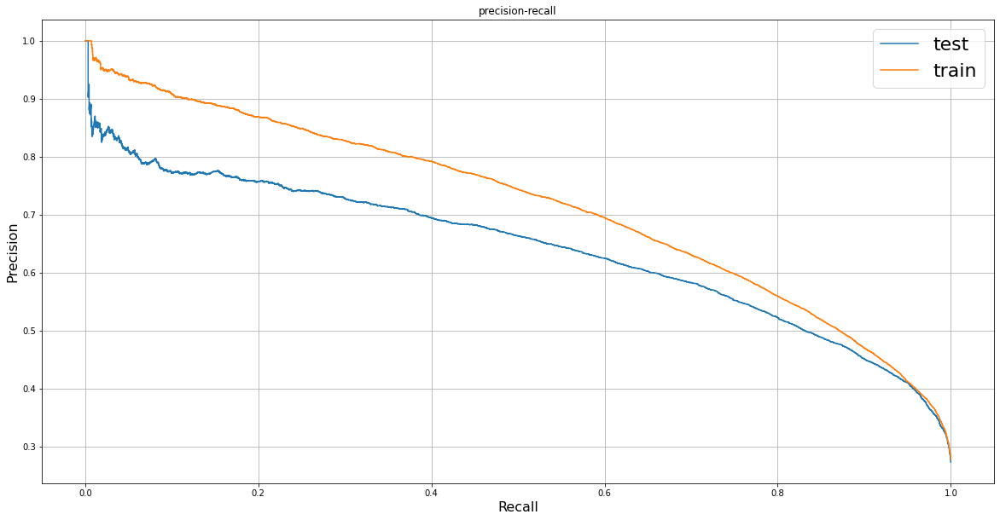

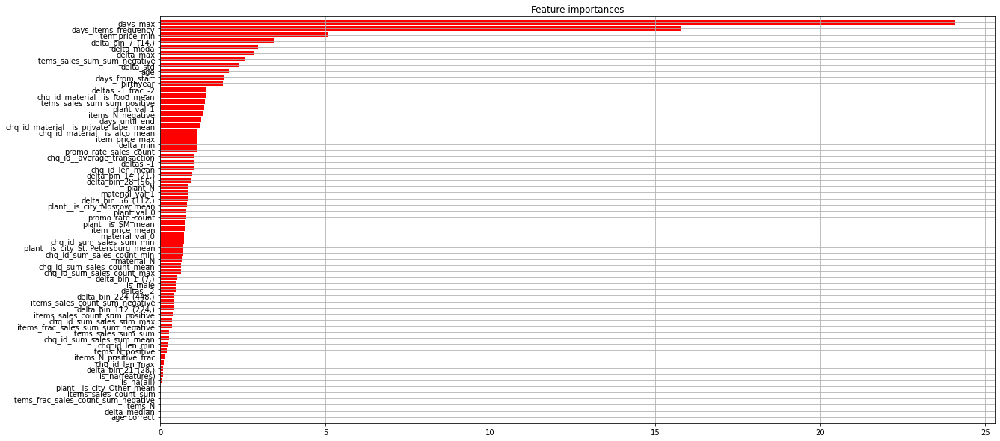

In [203]:
name = 'GB'

model = CatBoostClassifier(iterations=50)

model.fit(X_train.to_numpy(), 
          y_train)


p_train = model.predict_proba(X_train)[:, 1]
p_test  = model.predict_proba(X_test)[:, 1]

feature_importance = {k:v for k,v in sorted(zip(features, model.feature_importances_), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

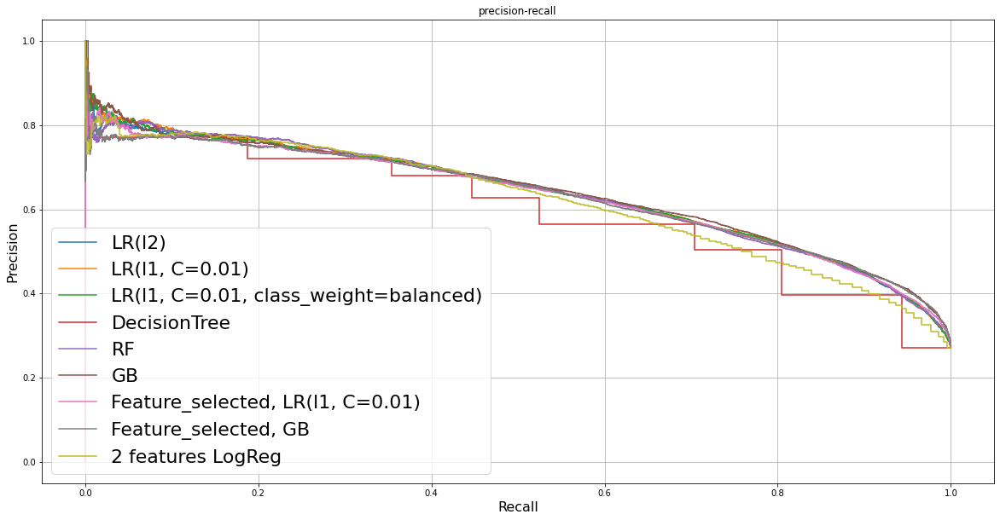

In [204]:
plt.figure(figsize = (20, 10))
plt.title('precision-recall')

for name, dct in global_res.items():
    precision, recall, thresholds = precision_recall_curve(dct['y_test'], 
                                                           dct['p_test'])
    plt.step(recall, precision, label = name, where='post')

plt.legend()
plt.xlabel('Recall', fontsize = 16)
plt.ylabel('Precision', fontsize = 16)
plt.grid()
plt.legend(fontsize = 22)
plt.show()

## Feature selection
Обратив внимание на графики сверху, выберем следующие признаки:

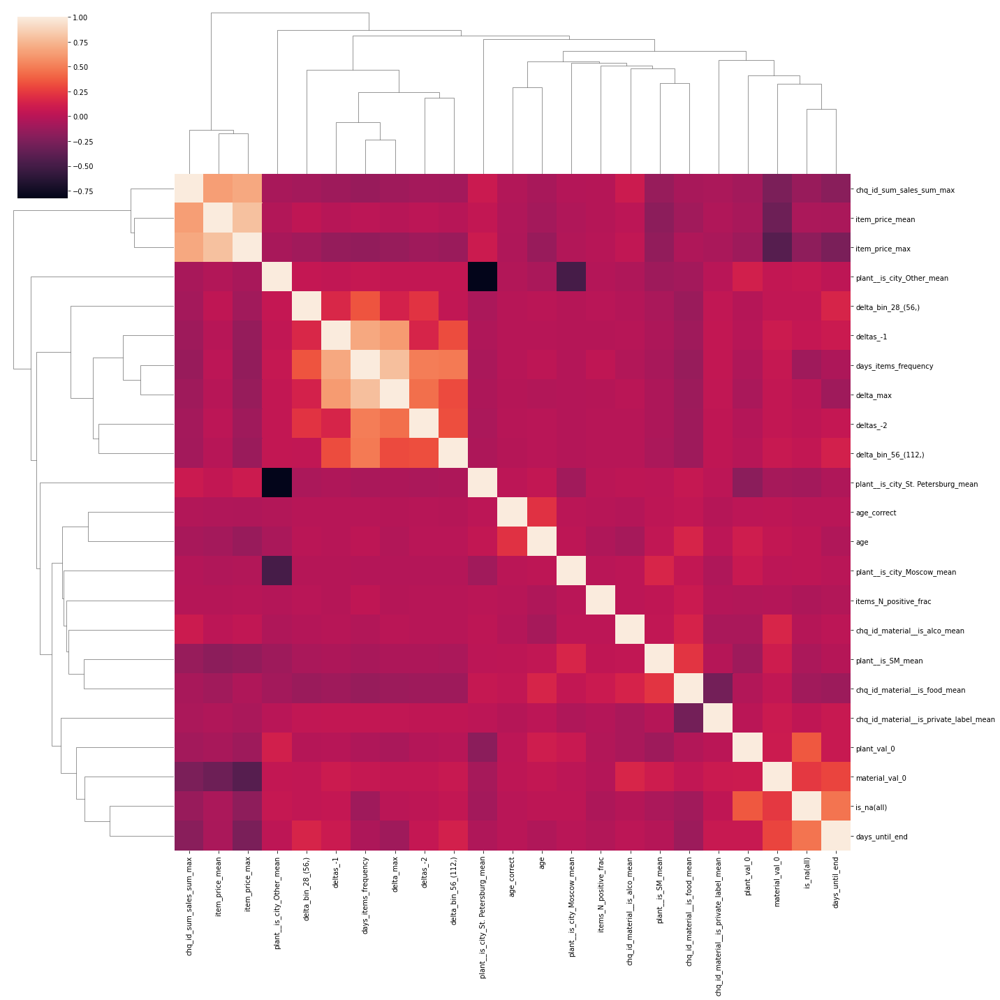

In [212]:
# data['chq_id_material'plant_val_0', 'item_price_mean', 'deltas_-1', 'items_N', 'delta_min', 'deltas_-2']#'chq_id_len_min'
features = ["items_N_positive_frac",
            "days_items_frequency",
            'plant__is_SM_mean',
            'is_na(all)',
            'plant__is_city_Moscow_mean',
            'plant__is_city_Other_mean',
            'plant__is_city_St. Petersburg_mean',
            'chq_id_material__is_food_mean',
            'chq_id_material__is_alco_mean',
            'chq_id_material__is_private_label_mean',
            'age_correct',
            'material_val_0',
            'age',
            'chq_id_sum_sales_sum_max',
            'plant_val_0',
            'delta_bin_28_(56,)',
            'item_price_mean',
            'item_price_max',
            'deltas_-2',
            'delta_bin_56_(112,)',
            'deltas_-1',
            'delta_max',
            'days_until_end'
            ]

sns.clustermap(data[features].fillna(data[features].mean()).corr(), figsize = (20, 20))
# plt.savefig('results/corr_matrix.png')
plt.show()

train
roc_auc 0.836
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     50990
           1       0.67      0.46      0.55     19010

    accuracy                           0.79     70000
   macro avg       0.75      0.69      0.71     70000
weighted avg       0.78      0.79      0.78     70000

test
roc_auc 0.838
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     21853
           1       0.67      0.46      0.55      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.69      0.71     30000
weighted avg       0.78      0.79      0.78     30000



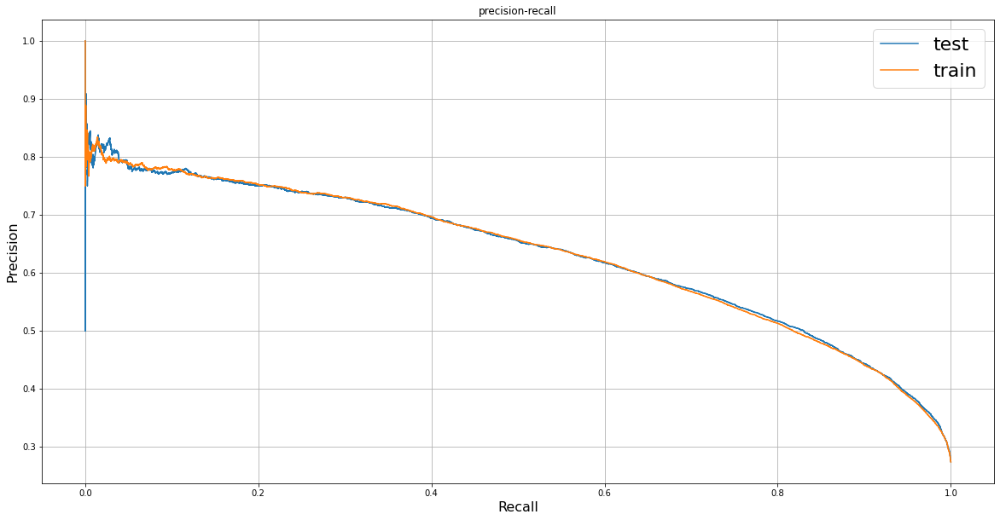

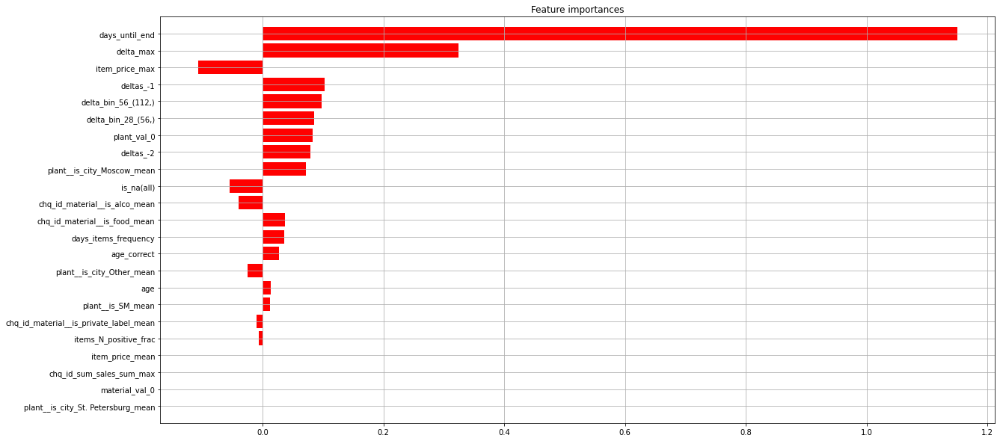

In [213]:
name = 'Feature_selected, LR(l1, C=0.01)'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l1',
                                         C = 0.01,
                                         solver = 'liblinear'))

model.fit(X_train[features].to_numpy(), y_train)


p_train = model.predict_proba(X_train[features])[:, 1]
p_test  = model.predict_proba(X_test[features])[:, 1]


feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

Learning rate set to 0.5
0:	learn: 0.4945171	total: 109ms	remaining: 5.34s
1:	learn: 0.4447975	total: 188ms	remaining: 4.51s
2:	learn: 0.4329347	total: 258ms	remaining: 4.04s
3:	learn: 0.4264417	total: 337ms	remaining: 3.88s
4:	learn: 0.4247767	total: 430ms	remaining: 3.87s
5:	learn: 0.4232402	total: 519ms	remaining: 3.8s
6:	learn: 0.4220580	total: 608ms	remaining: 3.73s
7:	learn: 0.4213390	total: 692ms	remaining: 3.63s
8:	learn: 0.4207156	total: 781ms	remaining: 3.56s
9:	learn: 0.4199114	total: 873ms	remaining: 3.49s
10:	learn: 0.4193034	total: 948ms	remaining: 3.36s
11:	learn: 0.4189334	total: 1.01s	remaining: 3.2s
12:	learn: 0.4184936	total: 1.07s	remaining: 3.05s
13:	learn: 0.4178943	total: 1.13s	remaining: 2.92s
14:	learn: 0.4174281	total: 1.22s	remaining: 2.84s
15:	learn: 0.4167339	total: 1.29s	remaining: 2.75s
16:	learn: 0.4163515	total: 1.37s	remaining: 2.67s
17:	learn: 0.4157813	total: 1.46s	remaining: 2.6s
18:	learn: 0.4151333	total: 1.56s	remaining: 2.54s
19:	learn: 0.414797

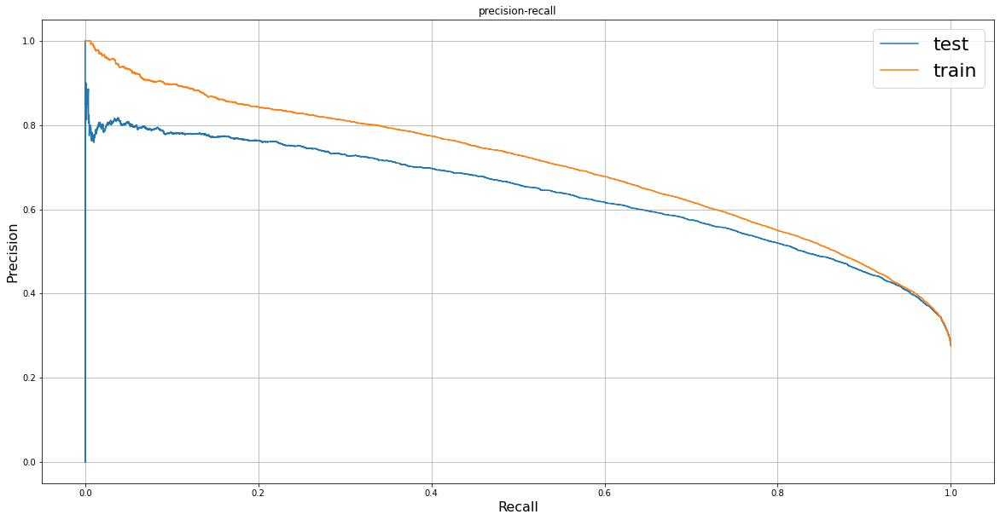

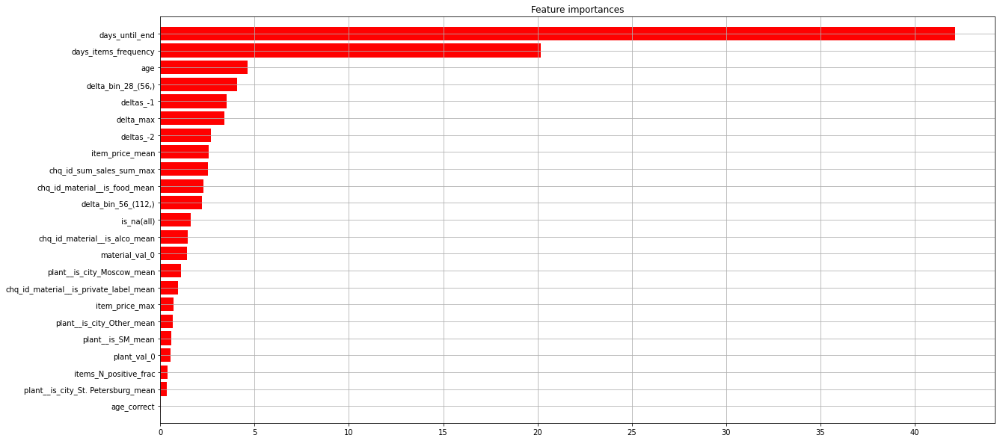

In [214]:
name = 'Feature_selected, GB'

model = CatBoostClassifier(iterations=50)#max_depth=5, n_estimators=100, class_weight='balanced')

model.fit(X_train[features].to_numpy(), 
          y_train)


p_train = model.predict_proba(X_train[features])[:, 1]
p_test  = model.predict_proba(X_test[features])[:, 1]

feature_importance = {k:v for k,v in sorted(zip(features, model.feature_importances_), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

train
roc_auc 0.823
              precision    recall  f1-score   support

           0       0.81      0.94      0.87     50990
           1       0.70      0.40      0.51     19010

    accuracy                           0.79     70000
   macro avg       0.76      0.67      0.69     70000
weighted avg       0.78      0.79      0.77     70000

test
roc_auc 0.826
              precision    recall  f1-score   support

           0       0.81      0.94      0.87     21853
           1       0.70      0.40      0.51      8147

    accuracy                           0.79     30000
   macro avg       0.75      0.67      0.69     30000
weighted avg       0.78      0.79      0.77     30000



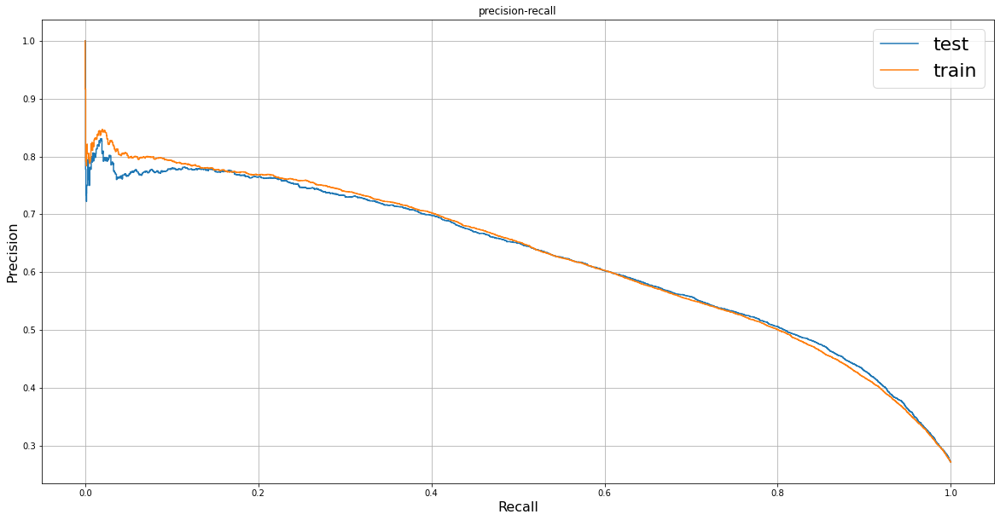

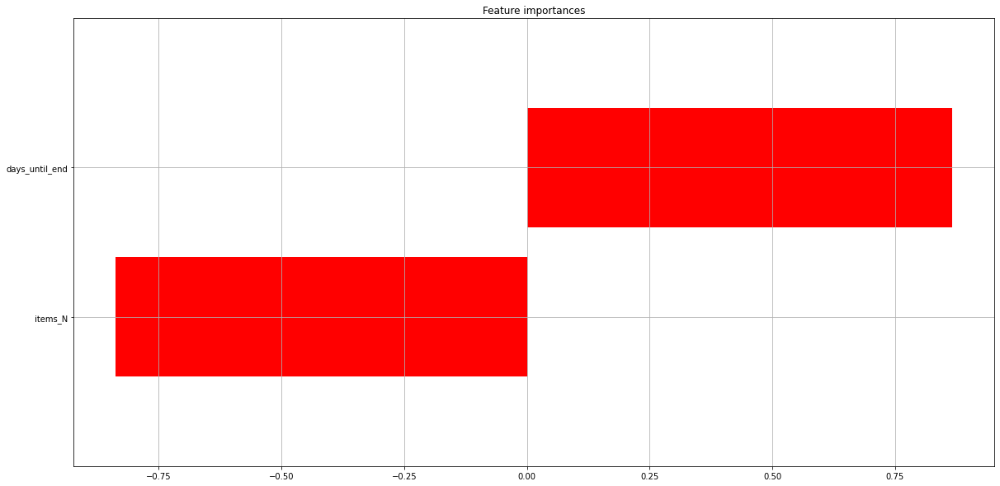

In [215]:
features = ['days_until_end', 'items_N']
name = '2 features LogReg'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l2'))

model.fit(X_train[features].to_numpy(), y_train)


p_train = model.predict_proba(X_train[features])[:, 1]
p_test  = model.predict_proba(X_test[features])[:, 1]


feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

train
roc_auc 0.818
              precision    recall  f1-score   support

           0       0.80      0.94      0.87     50990
           1       0.72      0.38      0.50     19010

    accuracy                           0.79     70000
   macro avg       0.76      0.66      0.68     70000
weighted avg       0.78      0.79      0.77     70000

test
roc_auc 0.820
              precision    recall  f1-score   support

           0       0.80      0.94      0.87     21853
           1       0.71      0.37      0.49      8147

    accuracy                           0.79     30000
   macro avg       0.76      0.66      0.68     30000
weighted avg       0.78      0.79      0.76     30000



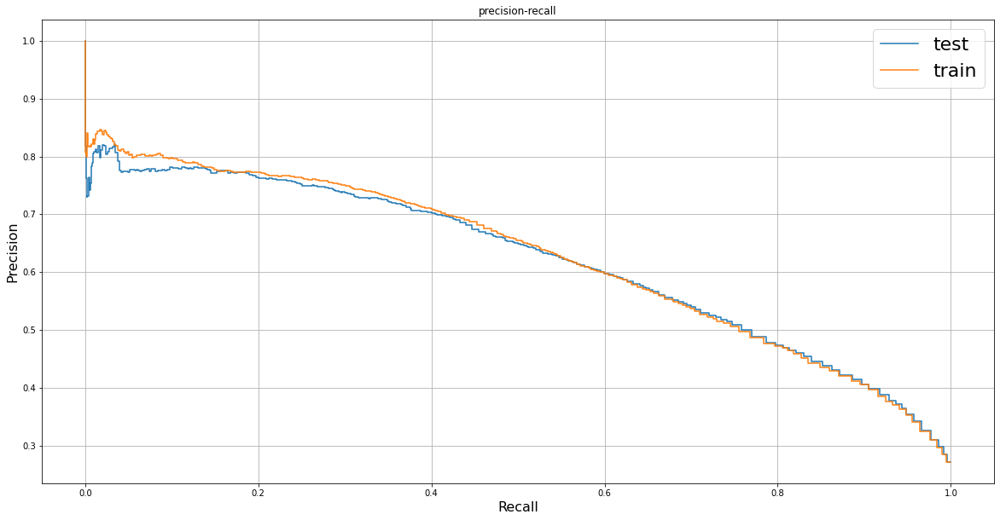

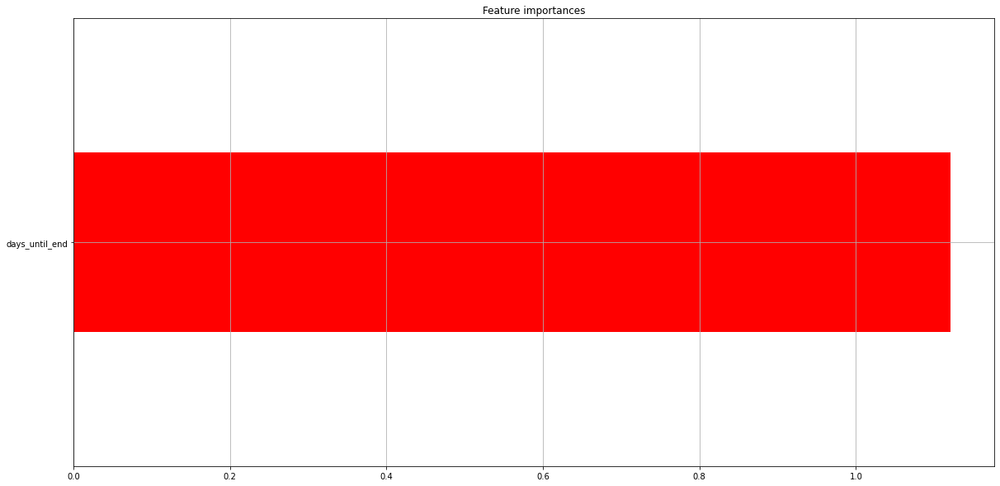

Живе Беларусь


In [216]:
features = ['days_until_end']
name = '2 features LogReg'
model = make_pipeline(StandardScaler(),
                      LogisticRegression(penalty='l2'))

model.fit(X_train[features].to_numpy(), y_train)


p_train = model.predict_proba(X_train[features])[:, 1]
p_test  = model.predict_proba(X_test[features])[:, 1]


feature_importance = {k:v for k,v in sorted(zip(features, model.steps[1][1].coef_[0]), key = lambda x:abs(x[1]))}
global_res[name] = {'p_test':p_test,
                     'p_train':p_train,
                     'y_test':y_test,
                     'y_train':y_train,
                     'feature_importance':feature_importance
                    }

validate(p_test, p_train, y_test, y_train, feature_importance)

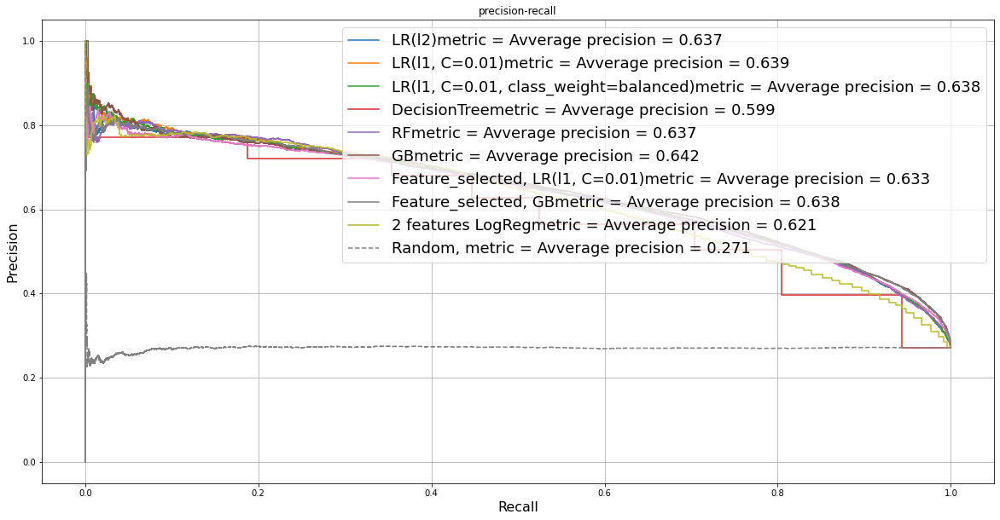

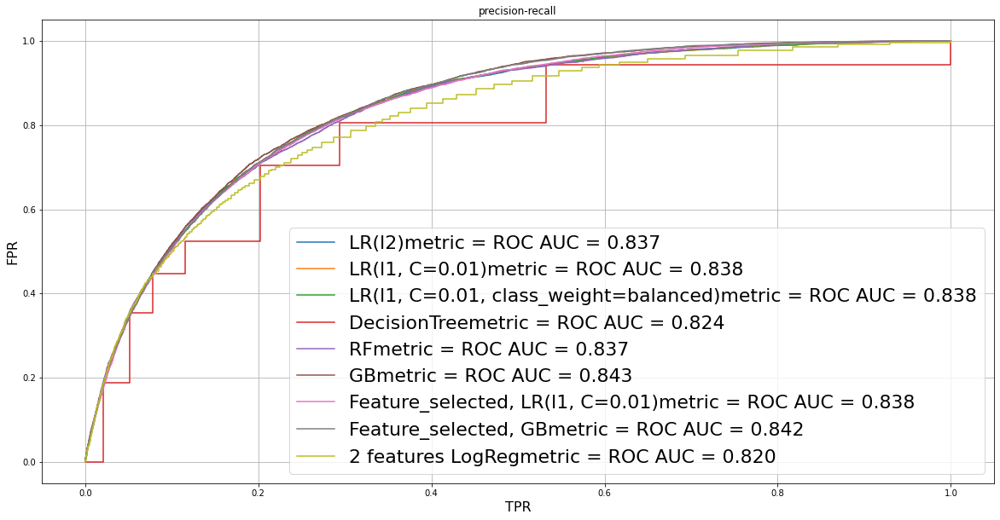

In [217]:
plt.figure(figsize = (20, 10))
plt.title('precision-recall')

for name, dct in global_res.items():
    precision, recall, thresholds = precision_recall_curve(dct['y_test'], 
                                                           dct['p_test'])
    plt.step(recall, precision, 
             label = name+'metric = Average precision = %2.3f'%average_precision_score(dct['y_test'], 
                                                                             dct['p_test']), 
             where='post')

#Random
_y = global_res['LR(l1, C=0.01, class_weight=balanced)']['y_test']
_p = global_res['LR(l1, C=0.01, class_weight=balanced)']['p_test'][::-1]
precision, recall, thresholds = precision_recall_curve(_y, 
                                                       _p)
plt.step(recall, precision, linestyle='--', color = 'grey',
          label = 'Random, metric = Average precision = %2.3f'%average_precision_score(_y,  _p) ,
          where='post')
plt.legend()
plt.xlabel('Recall', fontsize = 16)
plt.ylabel('Precision', fontsize = 16)
plt.grid()
plt.legend(fontsize = 18, loc = 'upper right')
plt.show()


plt.figure(figsize = (20, 10))
plt.title('precision-recall')

for name, dct in global_res.items():
    fpr, tpr, thresholds = roc_curve(dct['y_test'], 
                                     dct['p_test'])
    plt.step(fpr, tpr, 
             label = name+'metric = ROC AUC = %2.3f'%roc_auc_score(dct['y_test'], 
                                                                             dct['p_test']), 
             where='post')

plt.legend()
plt.xlabel('TPR', fontsize = 16)
plt.ylabel('FPR', fontsize = 16)
plt.grid()
plt.legend(fontsize = 22)
plt.show()

## Выводы:

- Предсказывая половину churn-a, мы ошибаемся в 3-4 случаях их 10-ти 
- ROC AUC ~ 0.84 (что неплохо для задачи ранжирования)
- Метрика худшей/лучшей модели практически не отличается
- Если построить модель на одном признаке метрики на 2-10% хуже лучшей модели

  С текущими метриками, эту модель можно заменить несколькими if-ми :(
  
## Почему так получилось?
- Cхема валидации, выбор отсечек для определения y, подсчет переменных были выполнены корректно
  
- Возможную причину имеет смысл искать в данных. По текущим данным мы можем сказать про пользователя:

    1. Если пользователь давно не был в сети, то возможно он уже churn (т.к. самый значащий признак всегда days_until_end)
    2. Если пользователь ходил к нам часто, то вероятность churn-а низка (второй самый значащий несвязанный с первым признак -- это количество походов в магазин, items_N)
    
  Двух этих признаков хватит, чтобы написать модель в два if-а, соперничающую со сложной моделью
  Чаще всего люди ходят в ближайший магазин, если он близок к местам их пребываня географически
 


## Можно ли сделать лучше?

- Возможно попробовать генерить новые признаки и смотреть, насколько они подходят.

    - Вариант альтернативной методологии:

    1) Брать две отсечки t1,t2 вместо того чтобы брать отсечку t1=t_start - признаки по типу days_until_end будут меньше влиять на задачу
    2) Понимать в каких конкретно процессах мы будем использовать результат модели, чтобы выбрать оптимальную метрику. Самое вероятное использование -- это программа лояльности или взаимодействие с пользователем. В таком случае самой простой метрикой является precision(recall=T) или TPR(FPR = T) 
    3) Усложнить схему валидации и измерить ее зависимость по времени

### Дополнительные идеи для признаков
- Кодирование магазина (магазины с конкурентами и без). 388 магазинов на 100000 клиентов, скорее всего плохо закодируются one-hot, лучше использовать счетчики.
  
- Выделить признаки, характеризующие регулярность походов в магазин
  (раз в X дней есть счет более чем на Y руб)

No handles with labels found to put in legend.


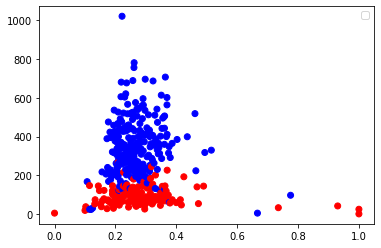

,N,M,plant_type
plant_key_0,,,
73a0dc181f83bed264af81ad8fafcf89,6.0,0.000000,True
d00f3f3d151a0c4c195f1e05870fbd19,20.0,0.100000,True
b7531d70dbb017fd3a72eeca4b4e91f6,39.0,0.102564,True
89befd1102aeaead24cfe2b9fa9997f9,168.0,0.107143,False
ffe49cdf45d56b04b8542e6abc4f5fb6,27.0,0.111111,True
...,...,...,...
27527712b072e72c35248f1c105b5534,34.0,0.735294,True
b0f07fe0f7de991bfca0de50391eb328,98.0,0.775510,False
fa6fd762eab57575a037d306299c6452,43.0,0.930233,True


In [218]:
# Кодирование магазина должнно хорошо сработать
# Кодирование магазина
def foo(o):
    return pd.Series({'N':len(o), 'M':o['y'].mean()})
o = data.groupby('plant_key_0')[['y','plant__is_SM_mean']].apply(foo).sort_values('M')

o = o.join((df_plants.set_index('plant')['plant_type']=='SM'))
plt.scatter(o['M'].to_numpy(), o['N'].to_numpy(), color = o['plant_type'].apply(lambda x:'red' if x else 'blue'))
plt.legend()
plt.show()
o